### Testing cache usage (3000 samples)

Include the analysis script and setup the folders with raw data

In [1]:
from benchmarking.analysis.analyze_results import *

In [2]:
# output_base_folder = Path("/iarai/home/ivan.svogor/storage-benchmarking-raw/referenced-experiments")
output_base_folder = Path("/iarai/home/ivan.svogor/storage-benchmarking/benchmark_output/caching-new")
s3_folder_filter="1711-cache/s3/*benchmark_e2e*"
scratch_folder_filter="1711-cache/scratch/*benchmark_e2e*"

#### Load raw data

In [3]:
df_dataloader_s3 = extract_timelines(output_base_folder, folder_filter=s3_folder_filter)
df_dataloader_scratch = extract_timelines(output_base_folder, folder_filter=scratch_folder_filter)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 432/432 [00:01<00:00, 226.15it/s]


In [4]:
df_gpuutil_s3 = extract_gpuutil(output_base_folder, folder_filter=s3_folder_filter)
df_gpuutil_scratch = extract_gpuutil(output_base_folder, folder_filter=scratch_folder_filter)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 432/432 [00:00<00:00, 8424.29it/s]


### Timeline plots

Each line corresponds to a unique function call.

timestamp False


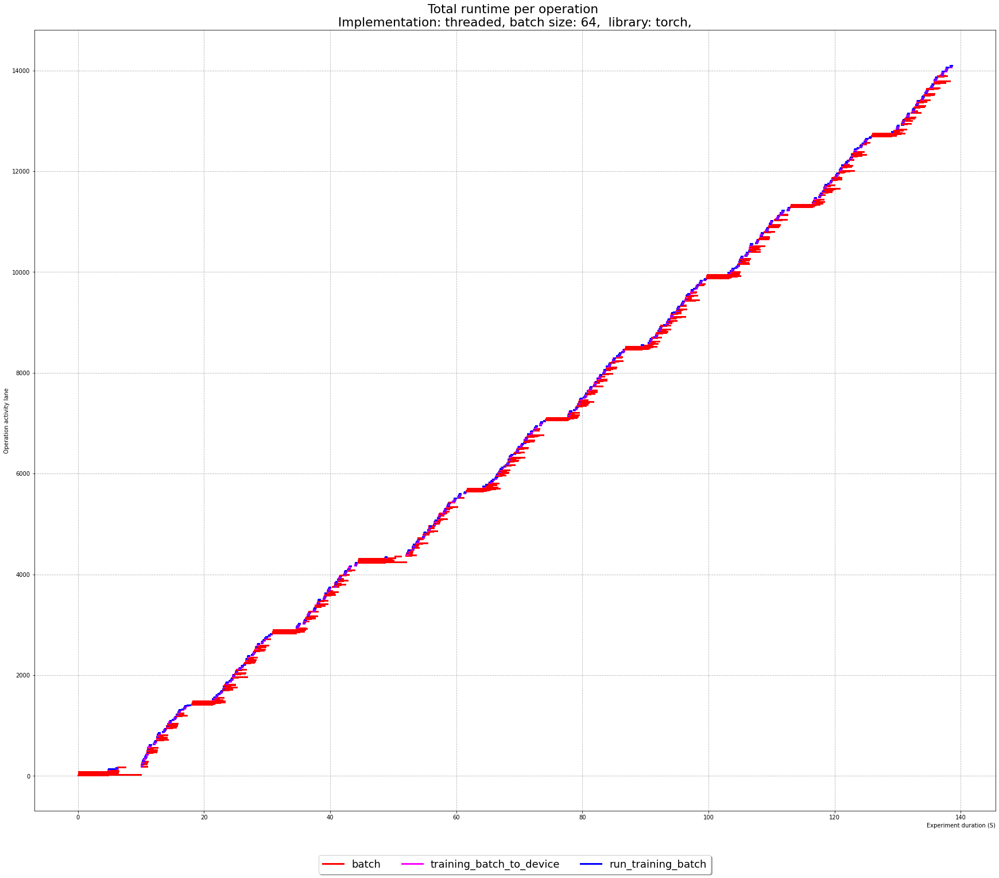

timestamp False


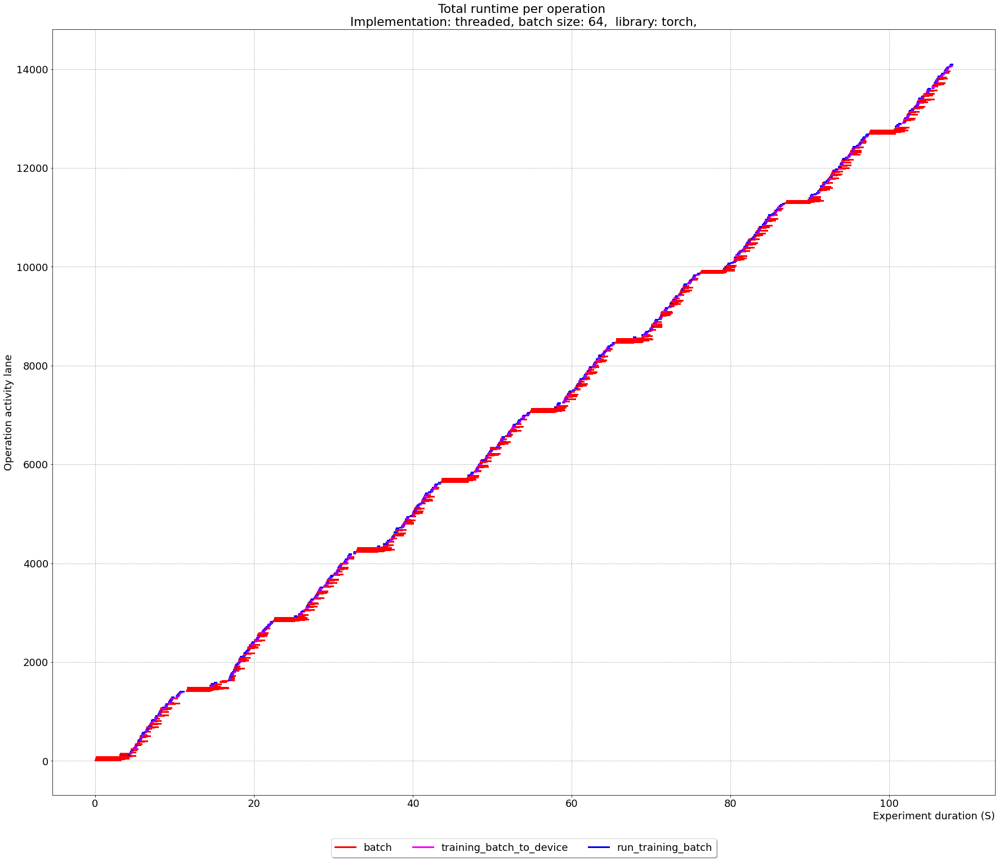

timestamp False


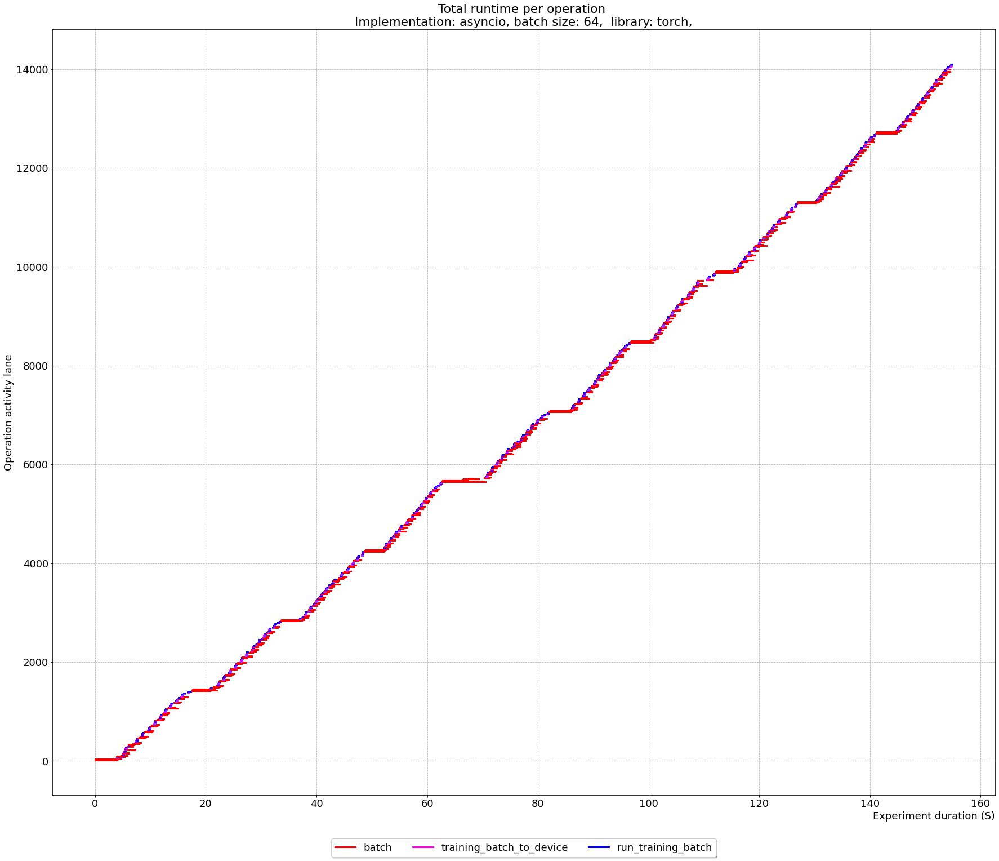

timestamp False


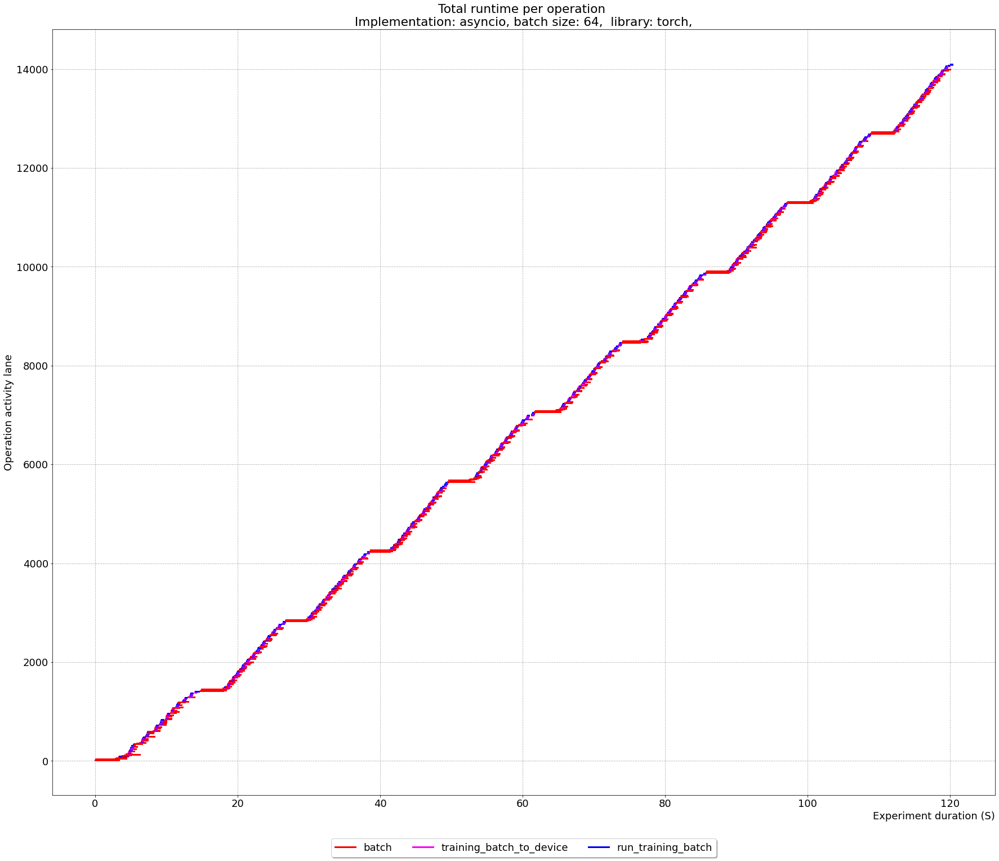

timestamp False


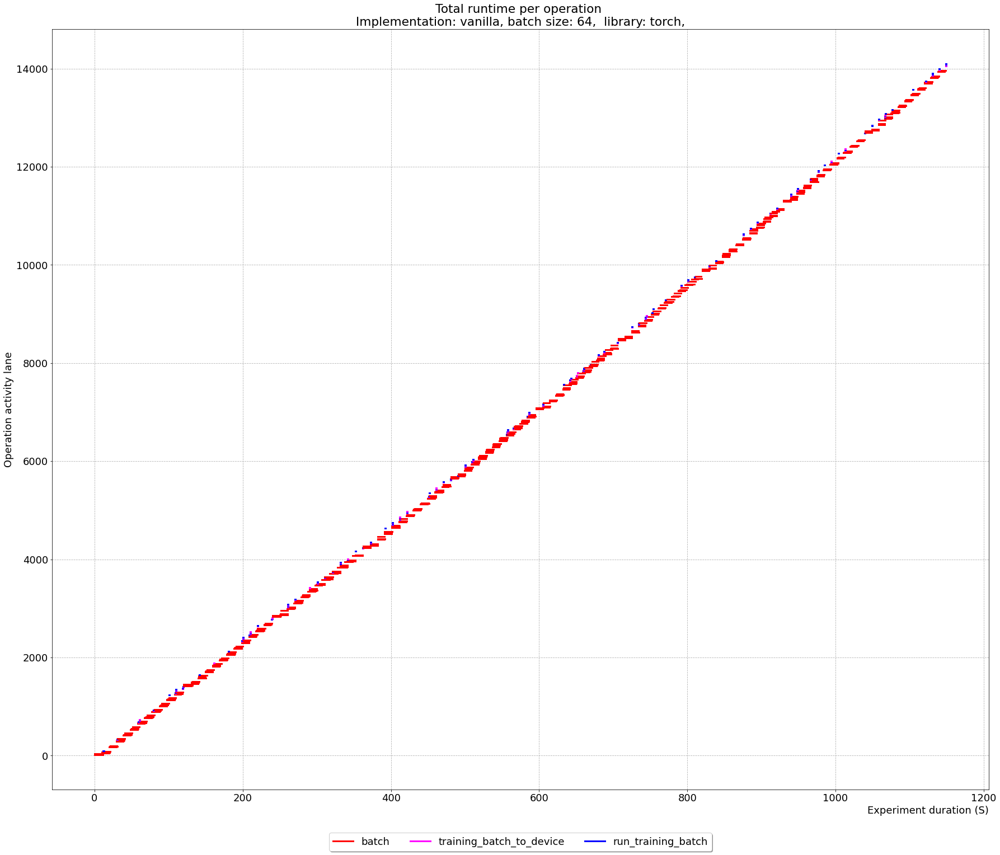

timestamp False


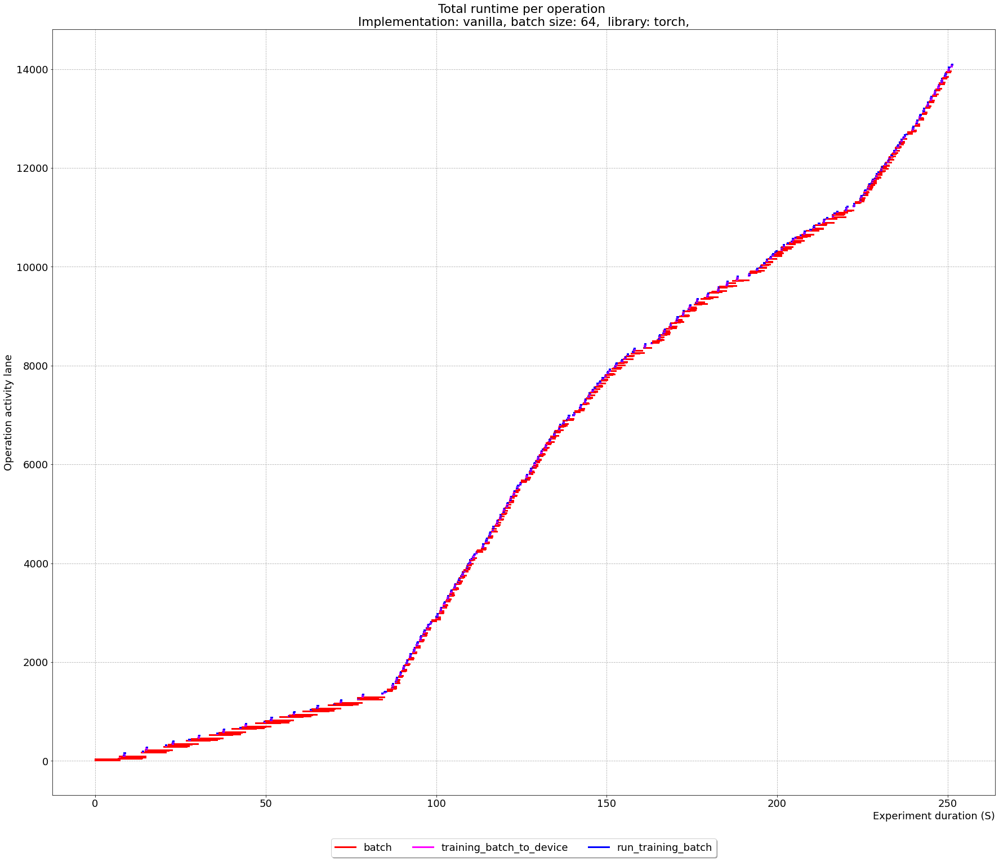

timestamp False


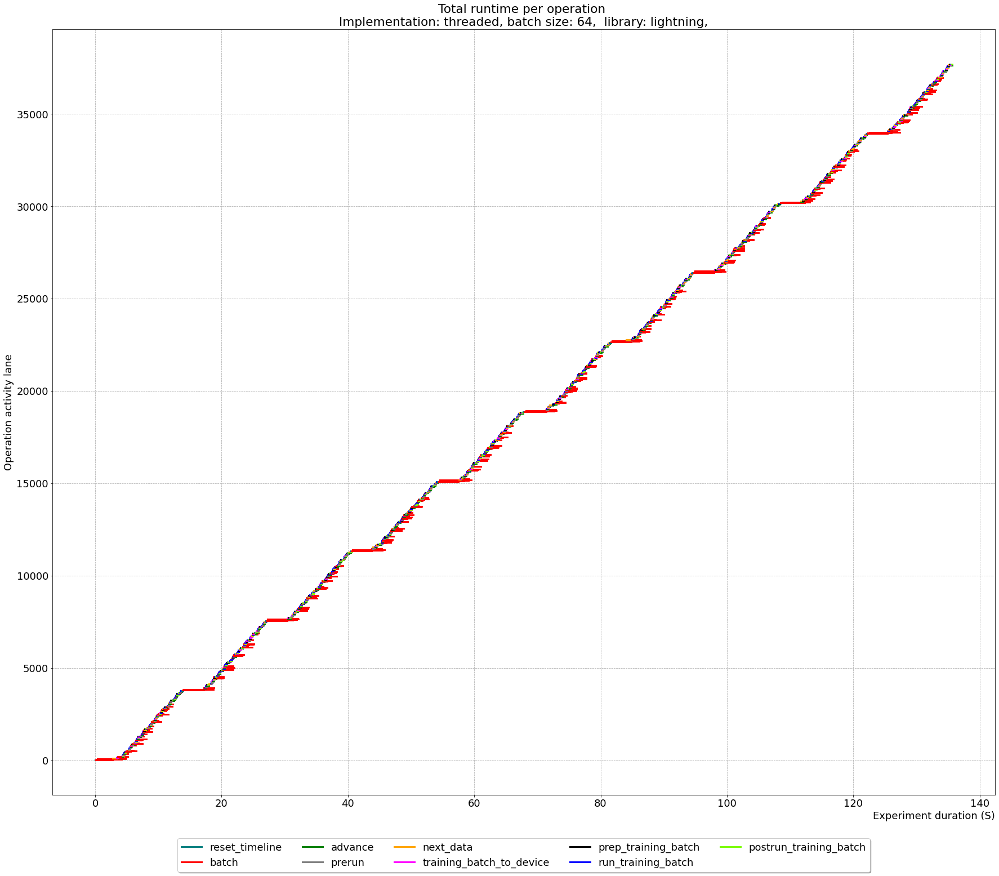

timestamp False


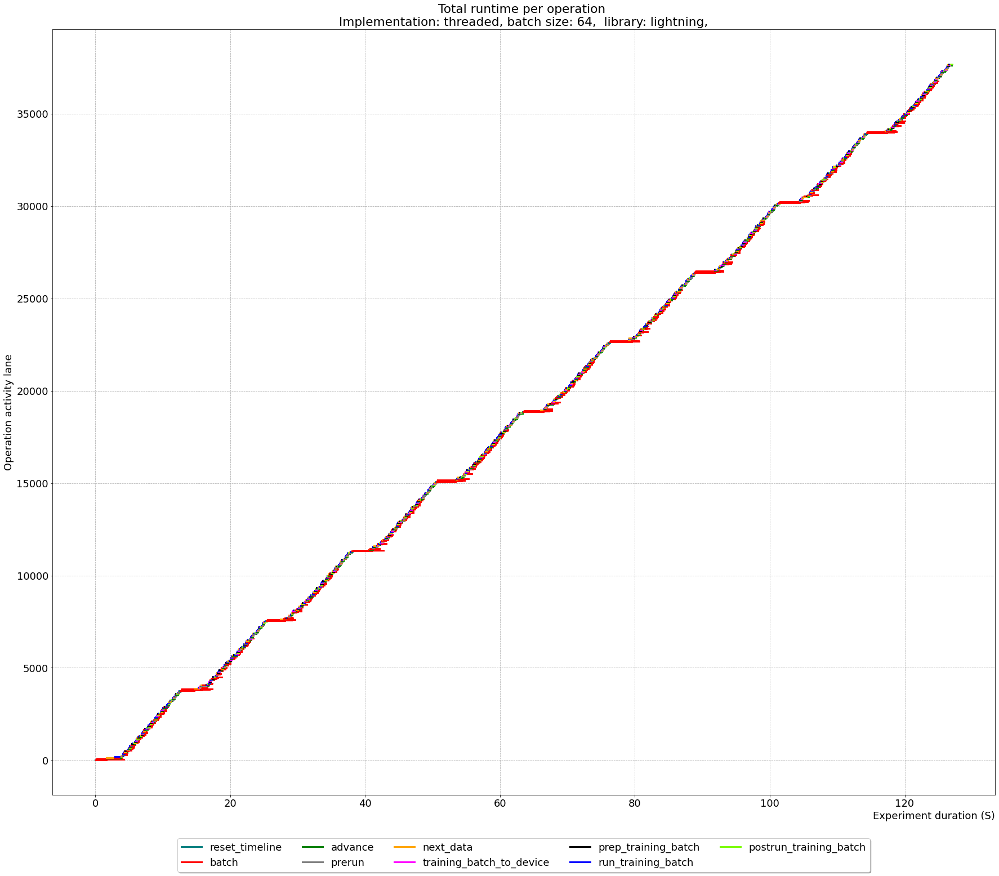

timestamp False


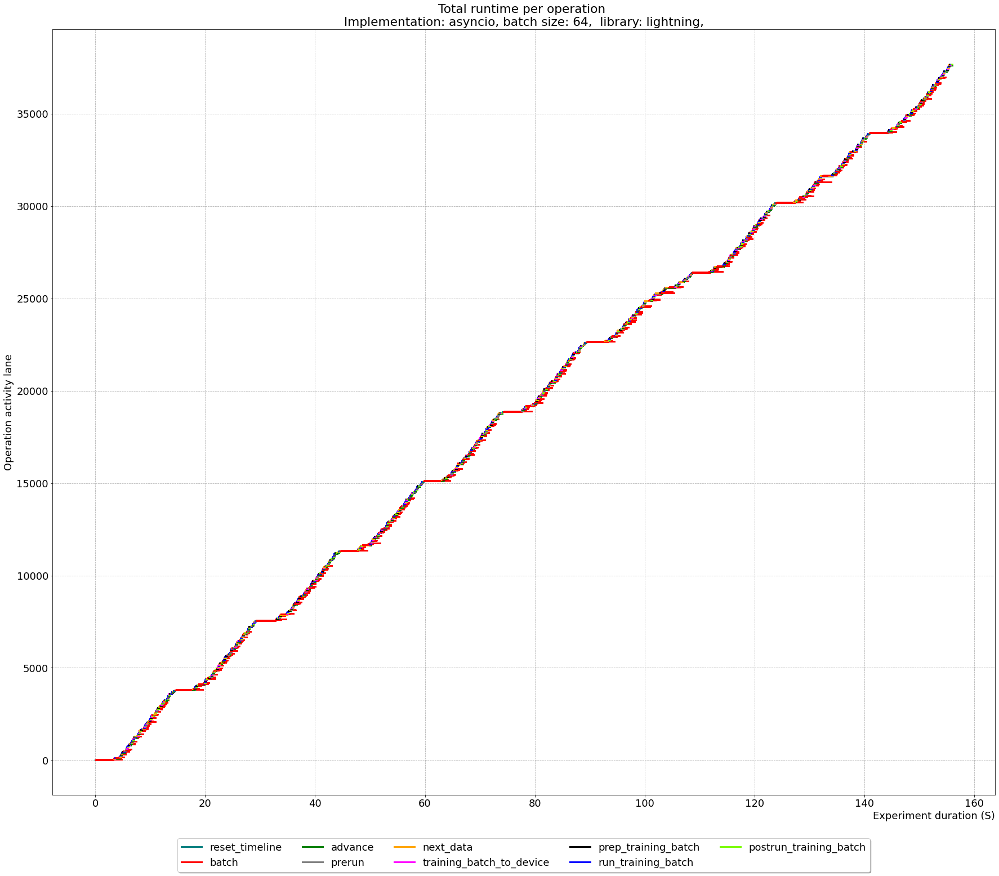

timestamp False


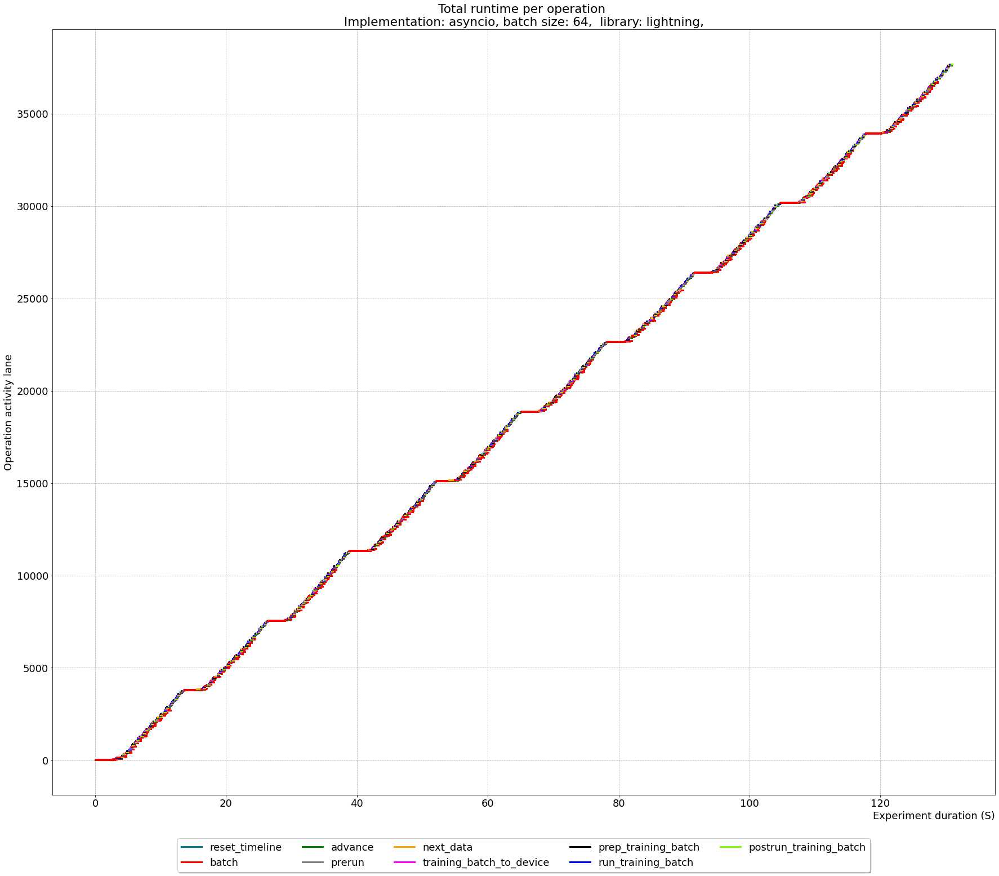

timestamp False


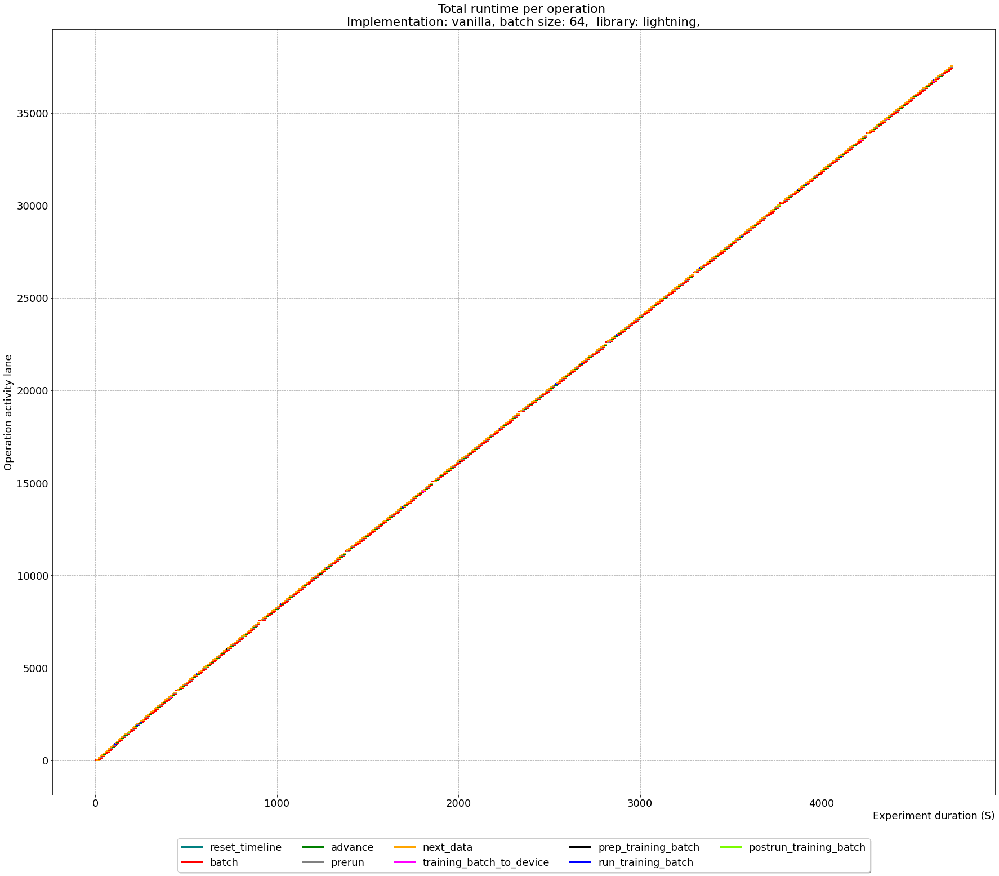

timestamp False


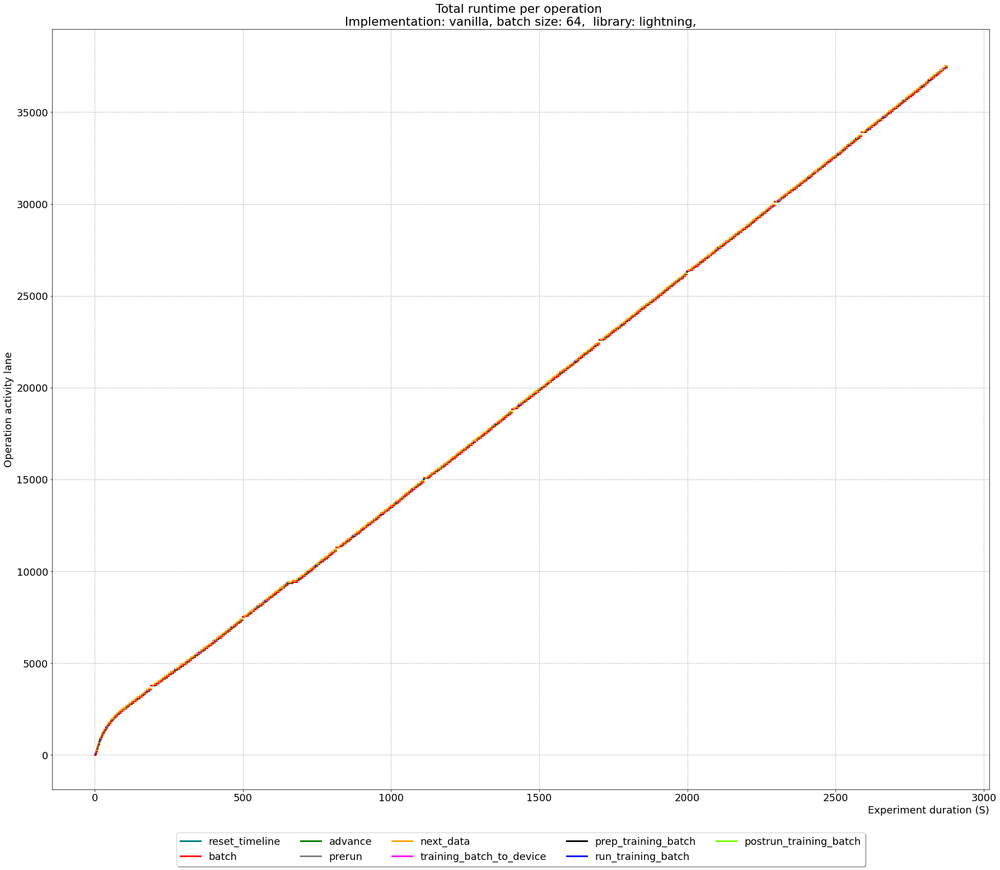

In [5]:
unique_runs_s3, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_s3)

for implementation in ["torch", "lightning"]:
    for run in sorted(unique_runs_s3):
        if implementation in run:
            df = df_dataloader_s3[df_dataloader_s3["run"]==run]
            dfgpu = df_gpuutil_s3[df_gpuutil_s3["run"]==run]
            df = df.drop_duplicates(subset="id", keep="first", inplace=False) 
            result = show_timelines_with_gpu(df, dfgpu, lanes, colors, run, False, False, False, 2)

timestamp False


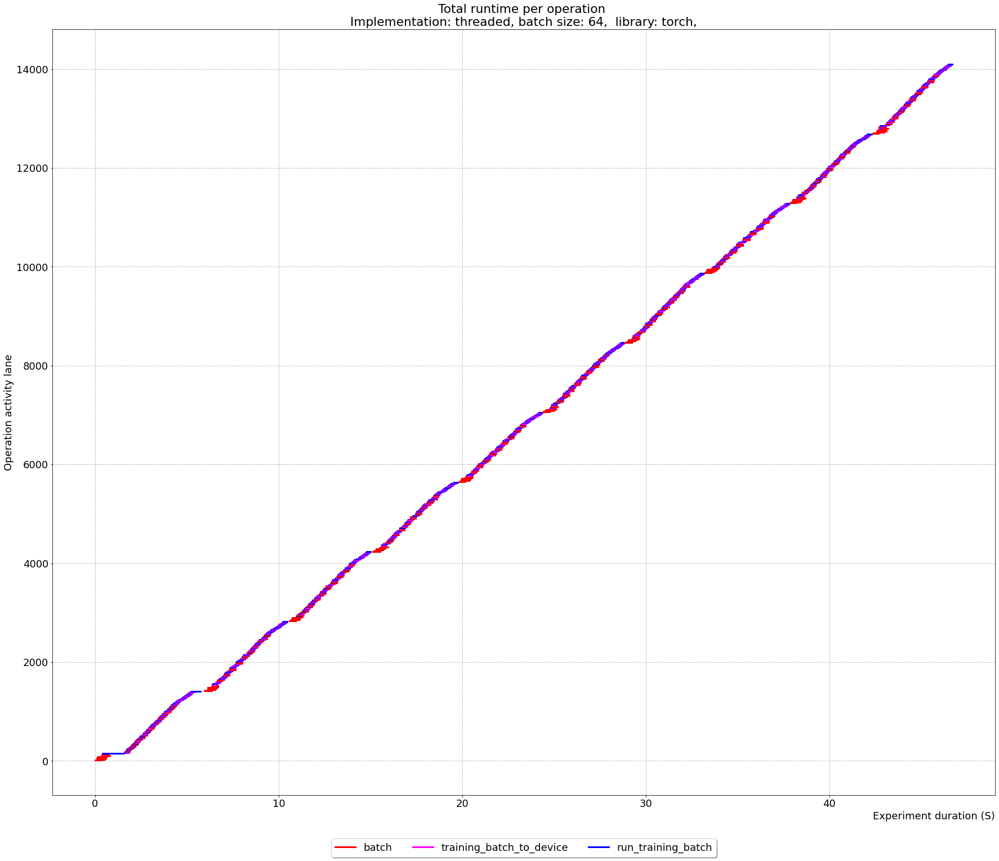

timestamp False


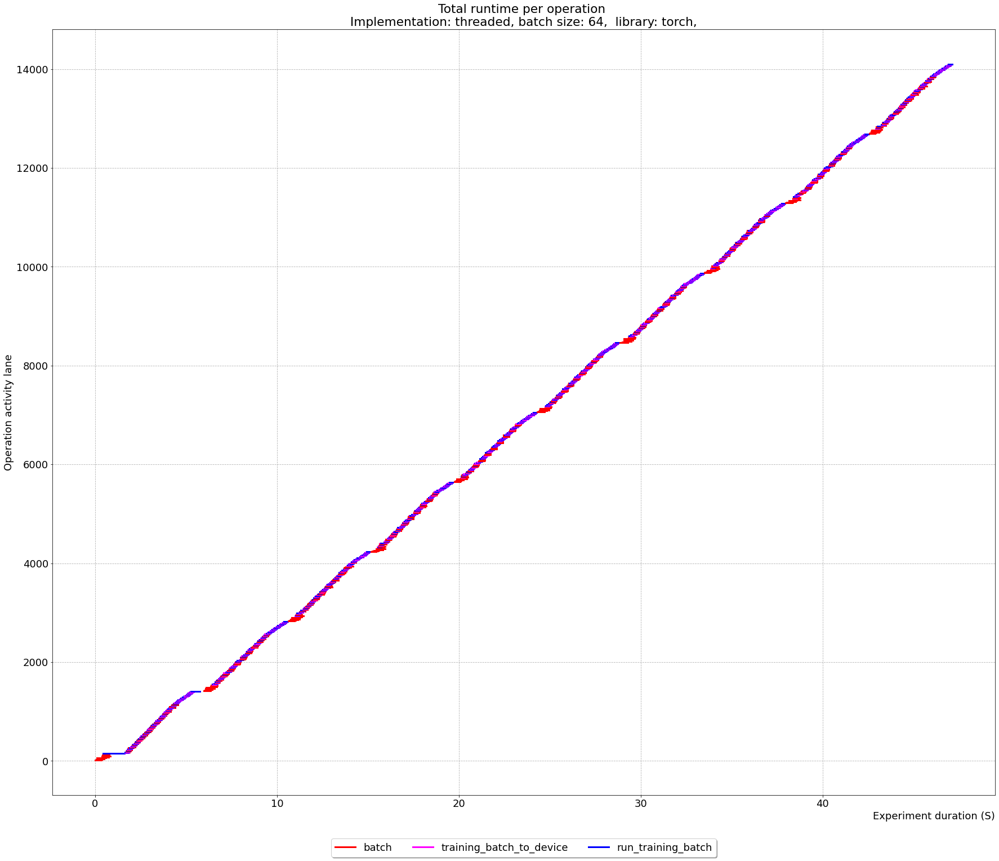

timestamp False


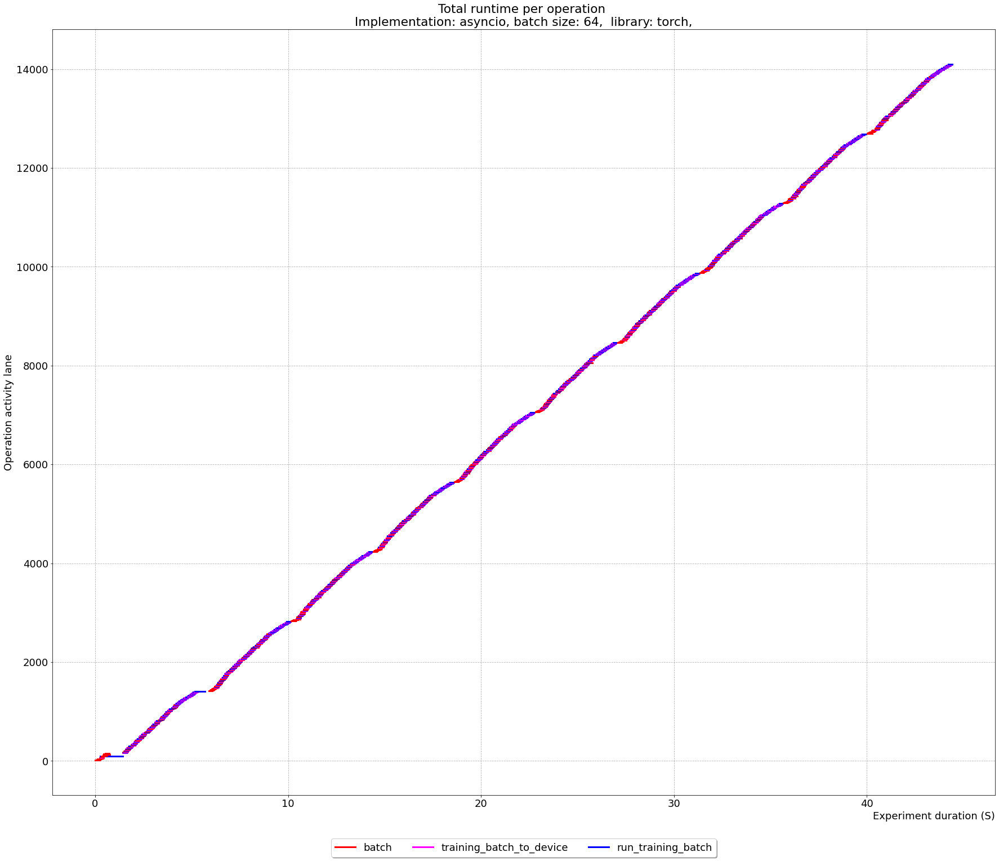

timestamp False


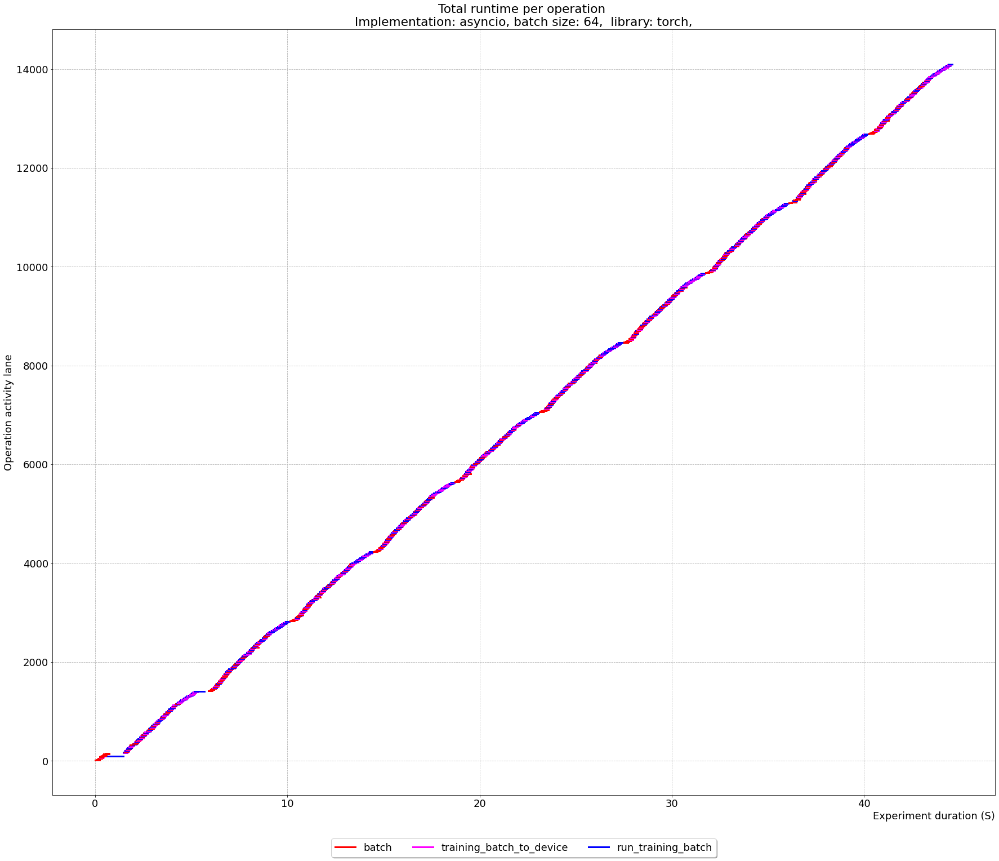

timestamp False


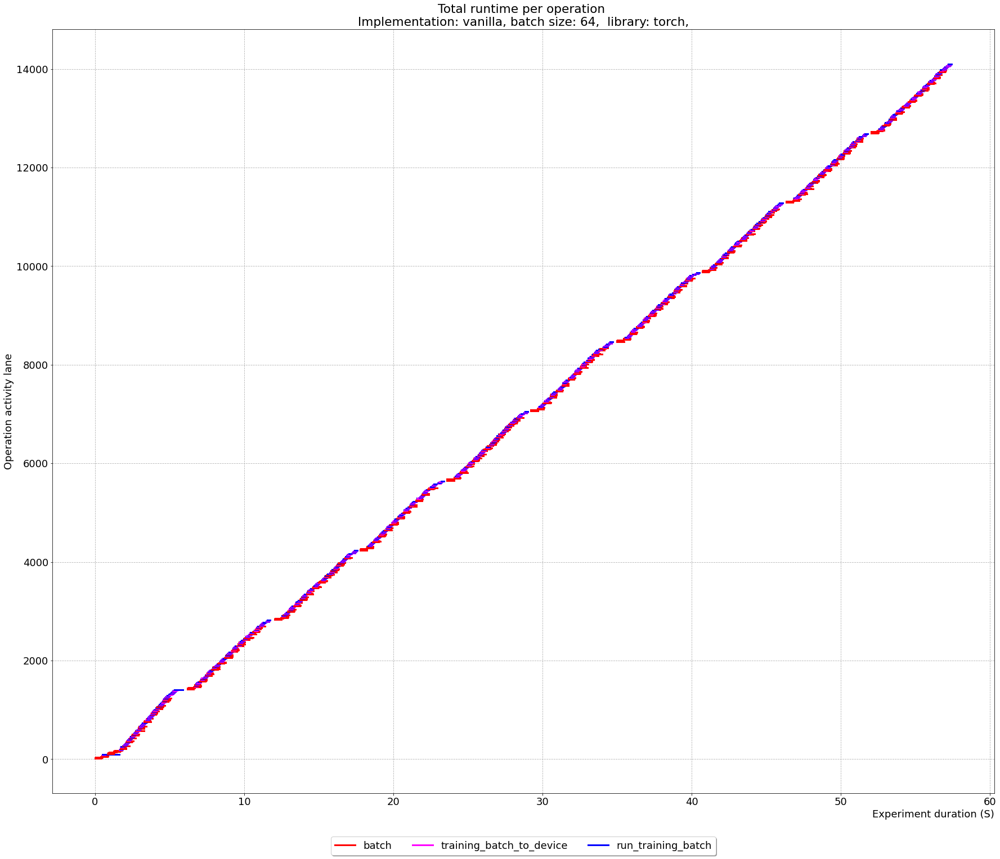

timestamp False


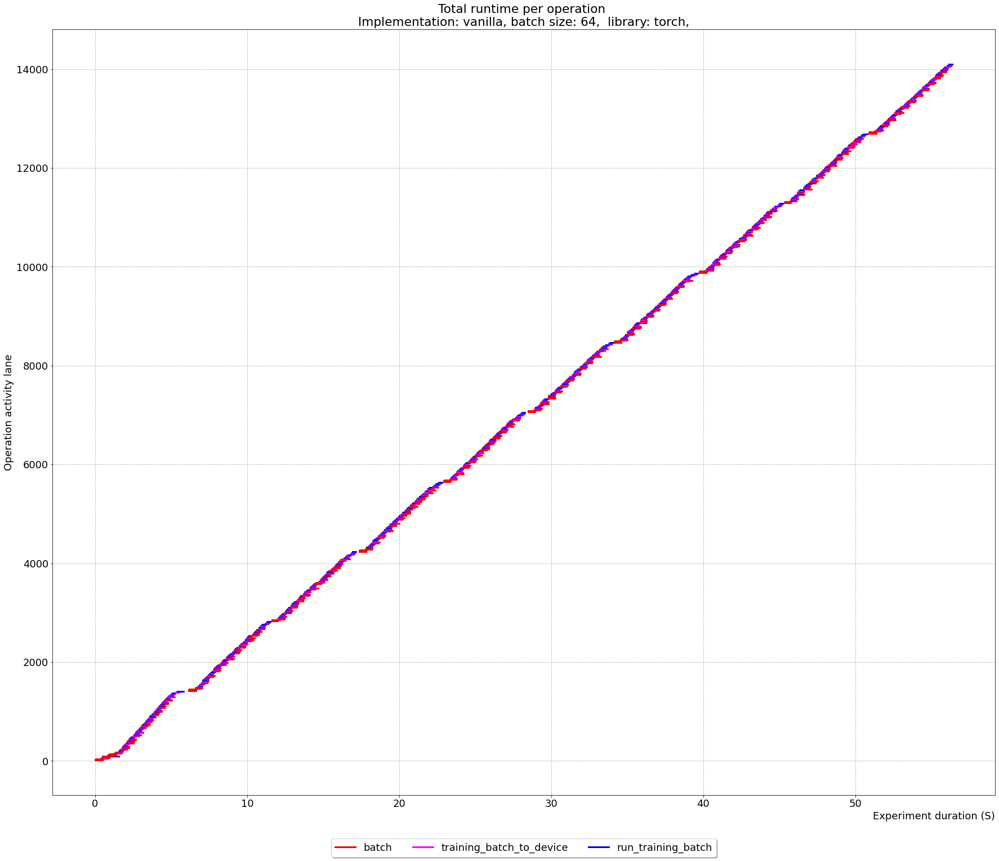

timestamp False


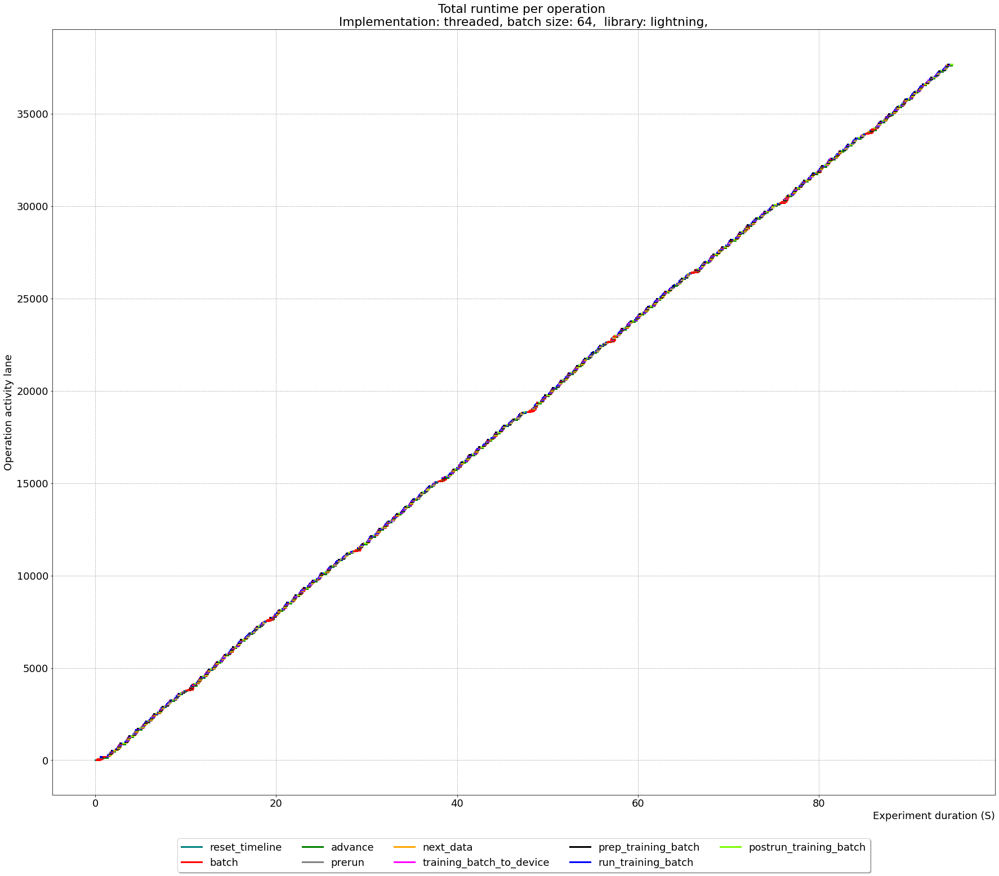

timestamp False


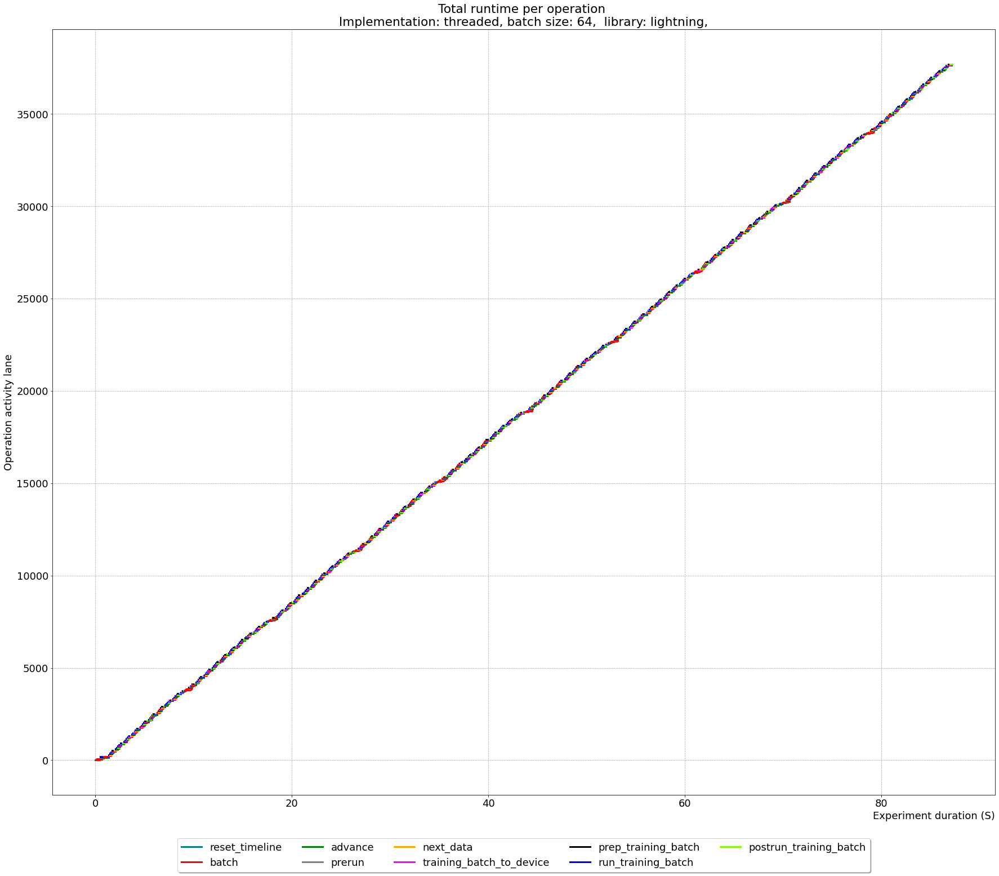

timestamp False


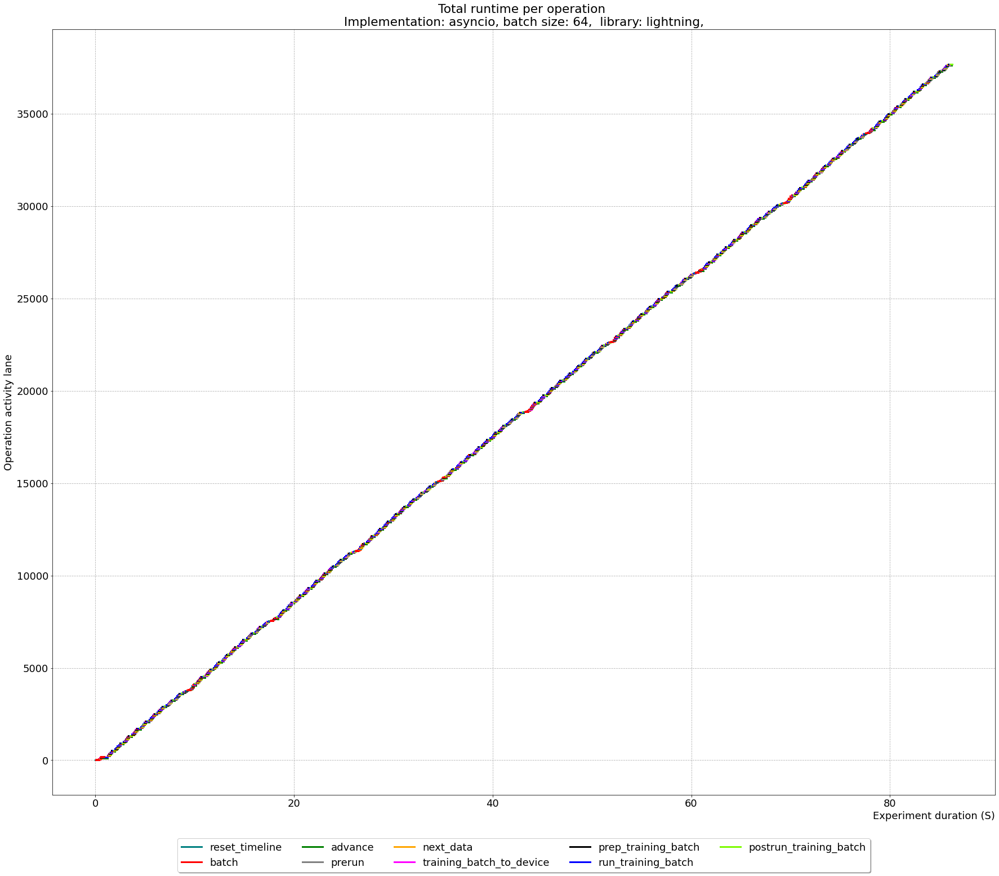

timestamp False


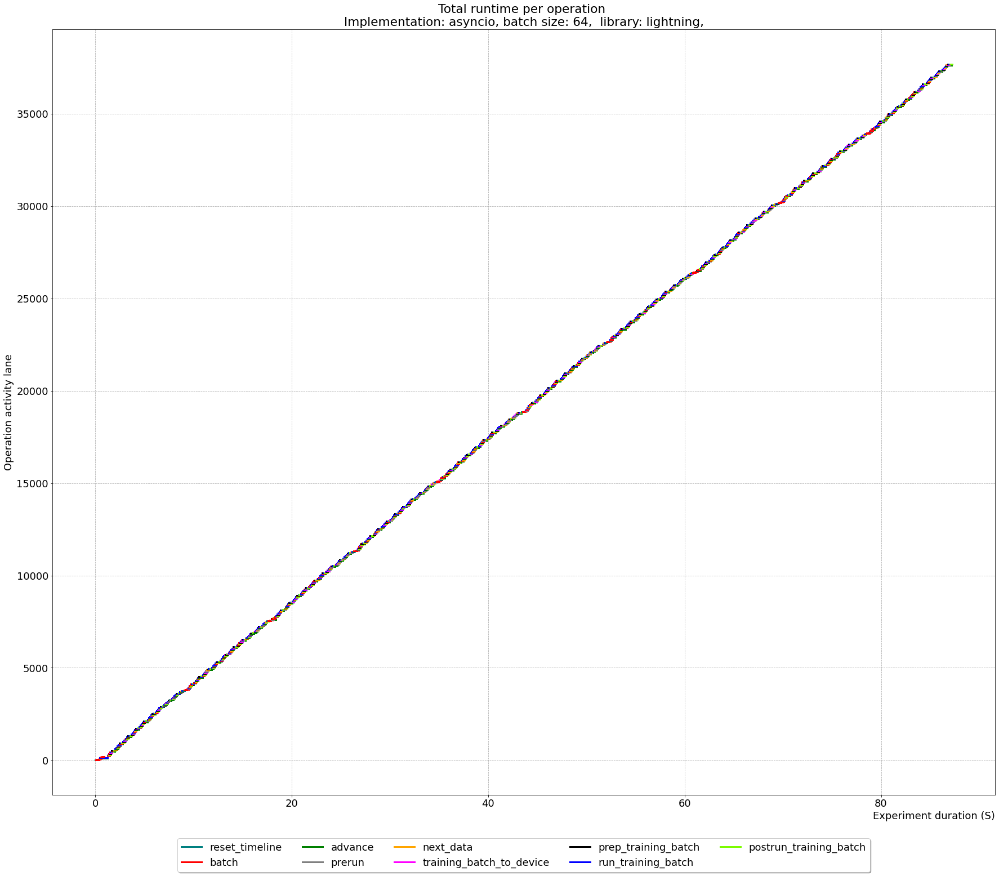

timestamp False


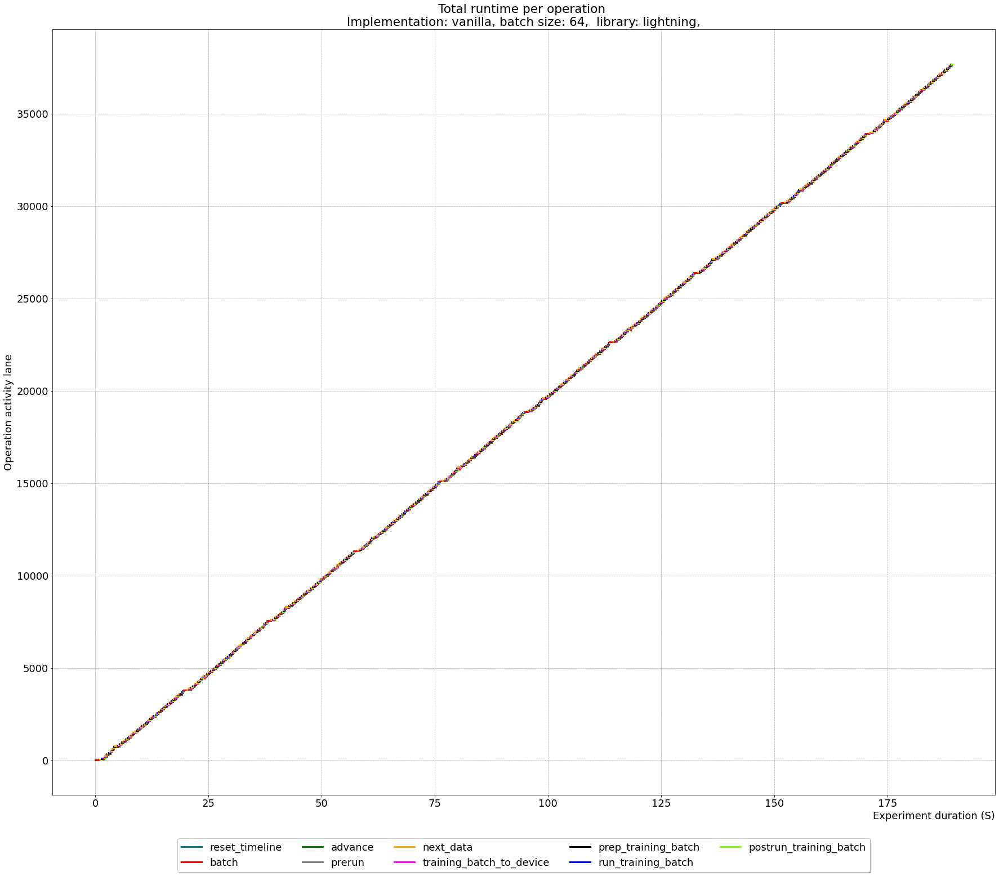

timestamp False


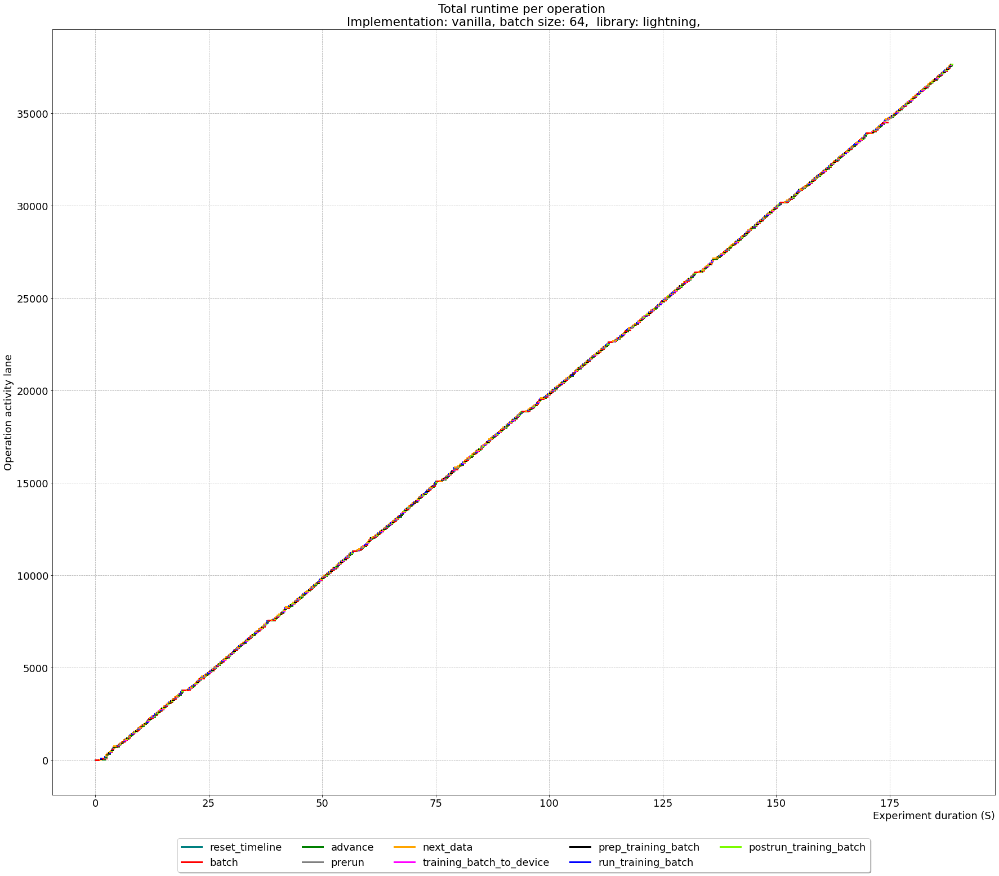

In [6]:
unique_runs_scratch, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_scratch)

for implementation in ["torch", "lightning"]:
    for run in sorted(unique_runs_scratch):
        if implementation in run:
            df = df_dataloader_scratch[df_dataloader_scratch["run"]==run]
            dfgpu = df_gpuutil_scratch[df_gpuutil_scratch["run"]==run]
            df = df.drop_duplicates(subset="id", keep="first", inplace=False)
            result = show_timelines_with_gpu(df, dfgpu, lanes, colors, run, False, False, False, 2)


### GPU utilization

In [7]:
print(unique_runs_s3, unique_runs_scratch)

['20220228f175031_benchmark_e2e_torch_s3_64_4_16_0_threaded_sync'
 '20220228f175255_benchmark_e2e_lightning_s3_64_4_16_0_threaded_sync'
 '20220228f175519_benchmark_e2e_torch_s3_64_4_16_1_threaded_sync'
 '20220228f175711_benchmark_e2e_lightning_s3_64_4_16_1_threaded_sync'
 '20220228f180426_benchmark_e2e_torch_s3_64_4_16_0_asyncio_sync'
 '20220228f180704_benchmark_e2e_lightning_s3_64_4_16_0_asyncio_sync'
 '20220228f180949_benchmark_e2e_torch_s3_64_4_16_1_asyncio_sync'
 '20220228f181153_benchmark_e2e_lightning_s3_64_4_16_1_asyncio_sync'
 '20220228f181858_benchmark_e2e_torch_s3_64_4_16_0_vanilla_sync'
 '20220228f183811_benchmark_e2e_lightning_s3_64_4_16_0_vanilla_sync'
 '20220228f195658_benchmark_e2e_torch_s3_64_4_16_1_vanilla_sync'
 '20220228f200112_benchmark_e2e_lightning_s3_64_4_16_1_vanilla_sync'] ['20220228f175926_benchmark_e2e_torch_scratch_64_4_16_0_threaded_sync'
 '20220228f180016_benchmark_e2e_lightning_scratch_64_4_16_0_threaded_sync'
 '20220228f180201_benchmark_e2e_torch_scratch

timestamp False
40.01234567901235 25.27027027027027


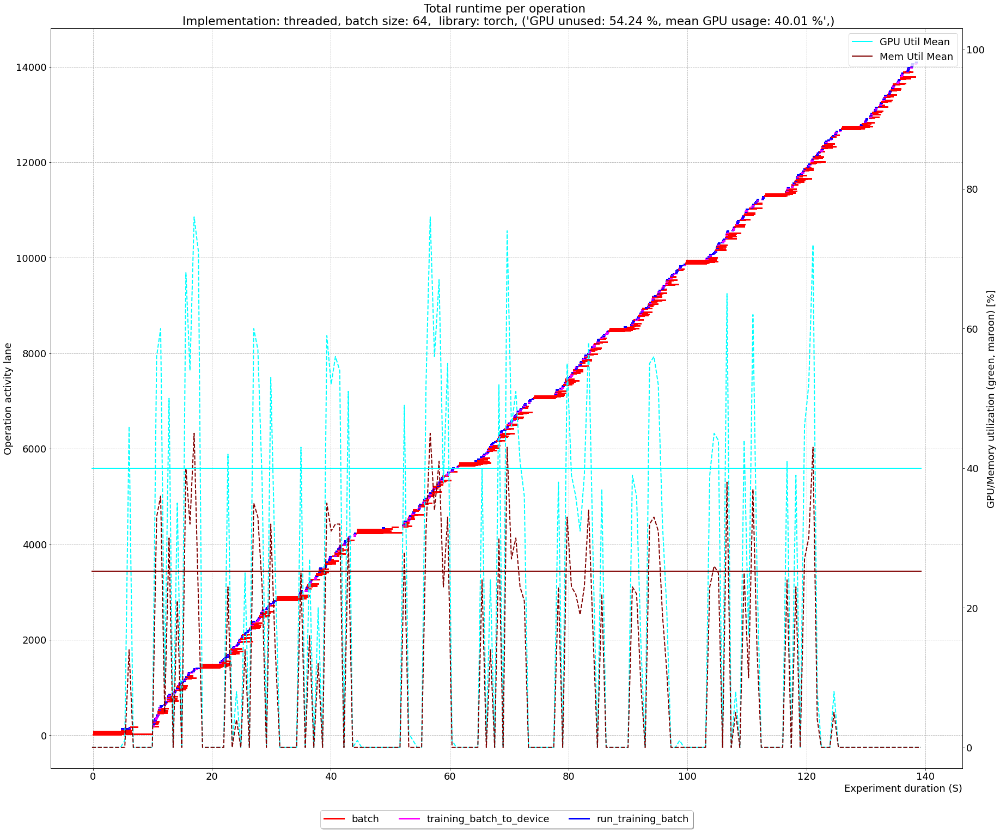

timestamp False
37.63846153846154 11.378151260504202


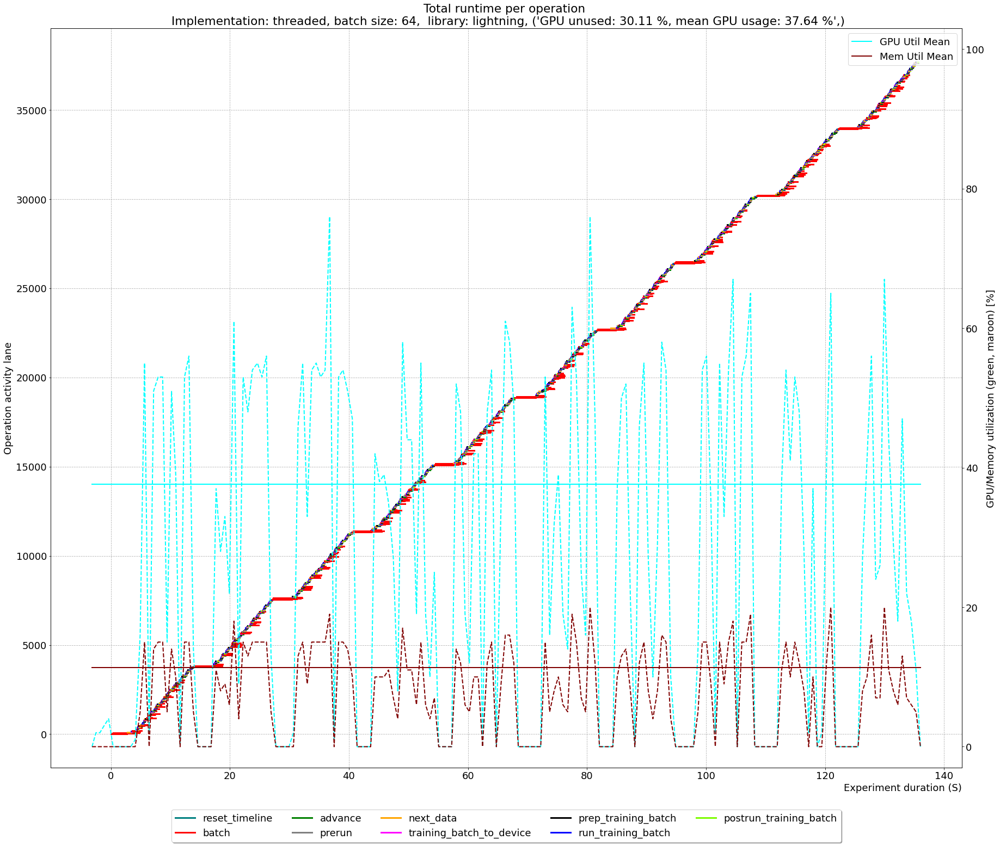

timestamp False
36.64 22.82857142857143


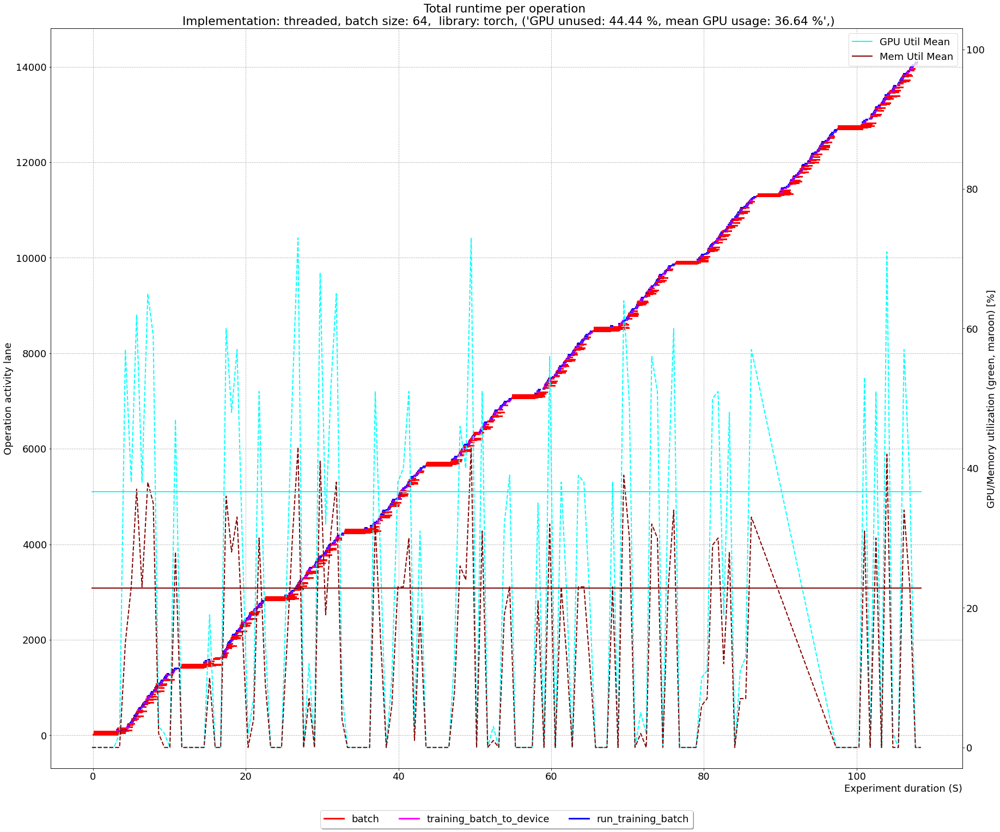

timestamp False
39.5078125 12.068965517241379


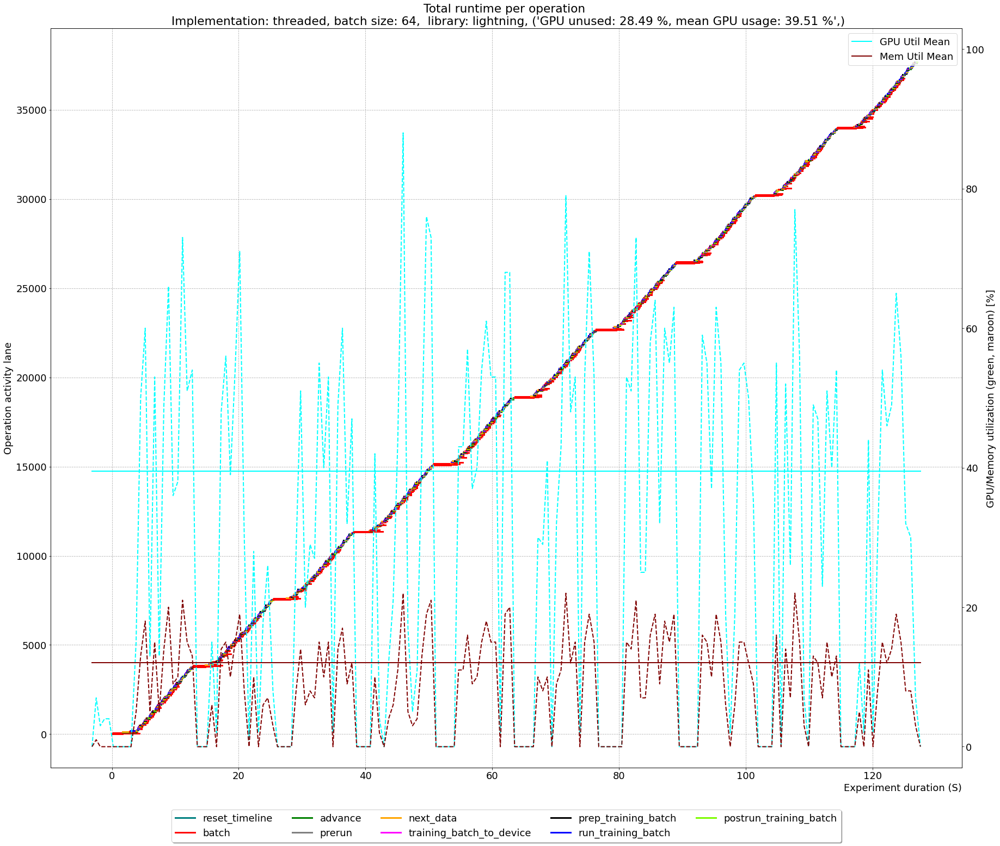

timestamp False
35.72857142857143 23.75


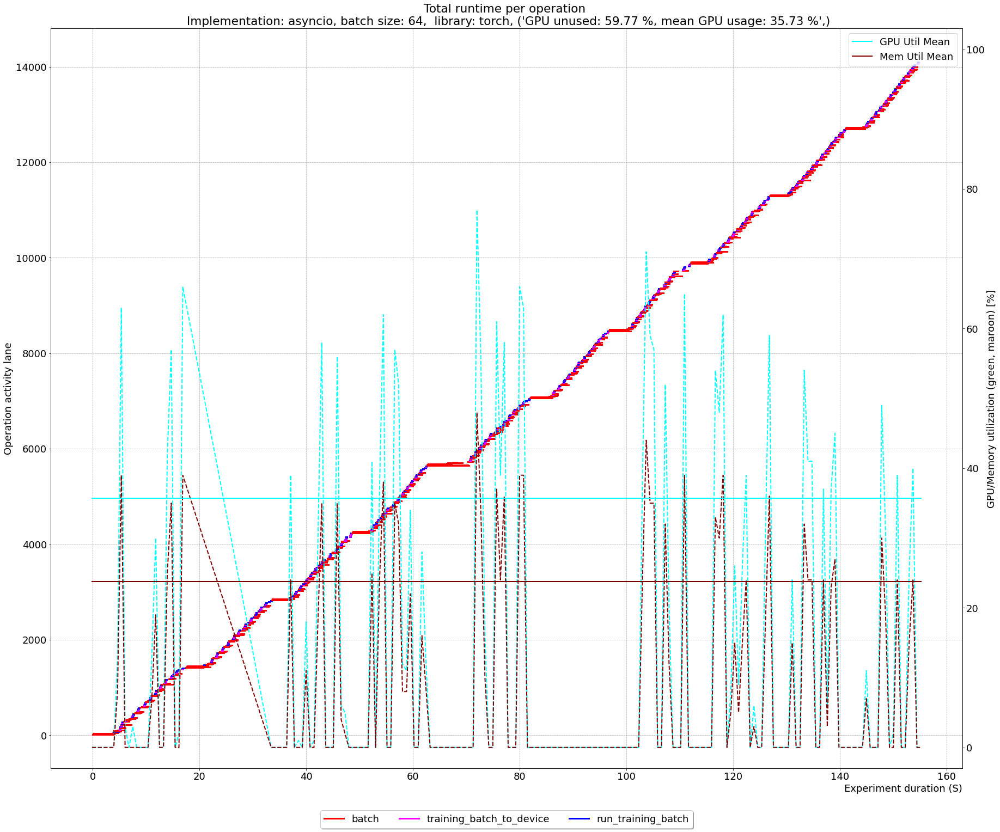

timestamp False
38.880434782608695 11.771084337349398


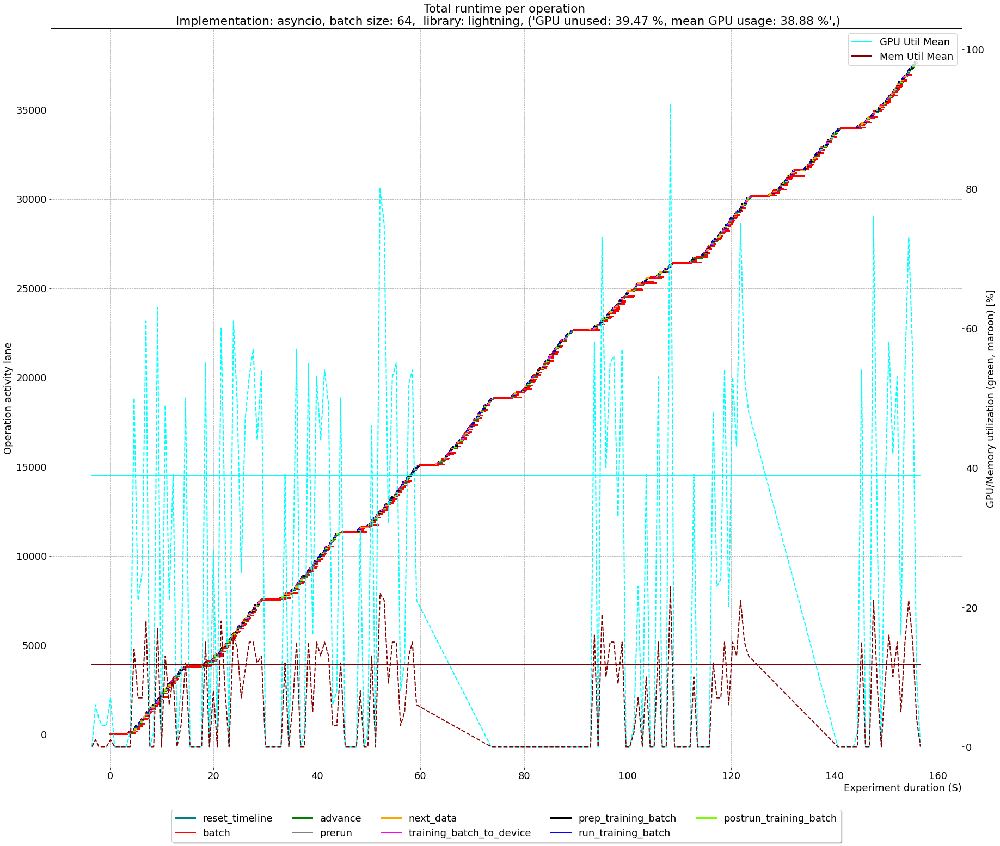

timestamp False
35.810344827586206 23.35185185185185


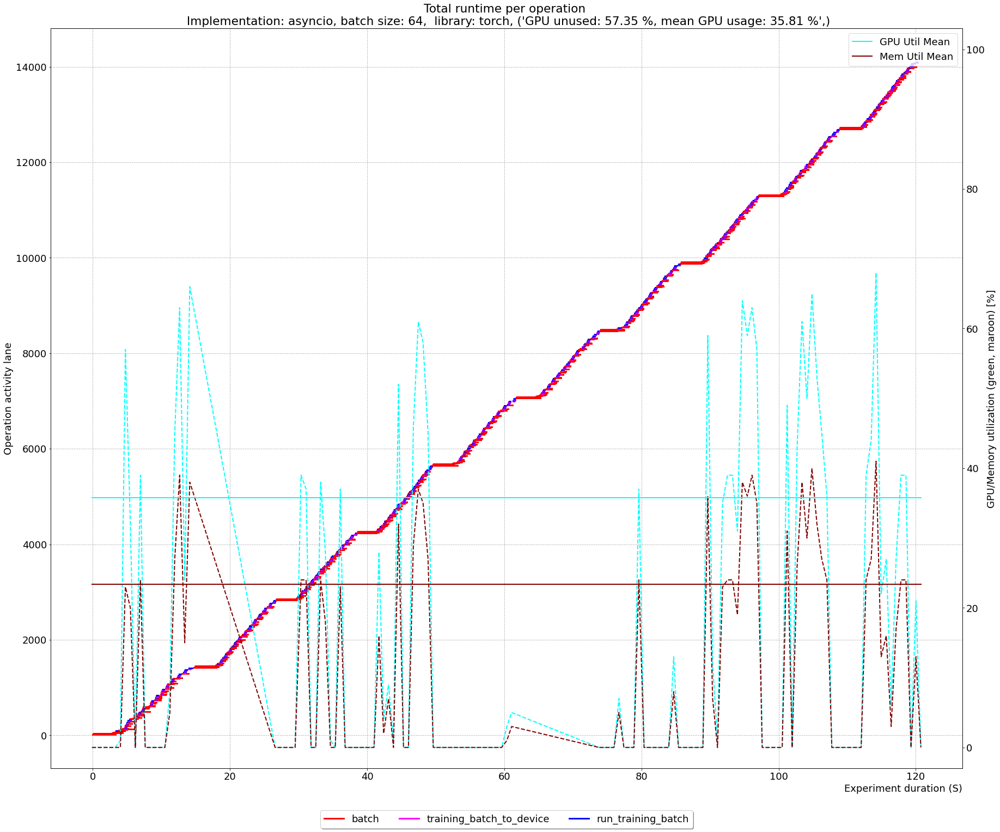

timestamp False
35.63846153846154 10.905982905982906


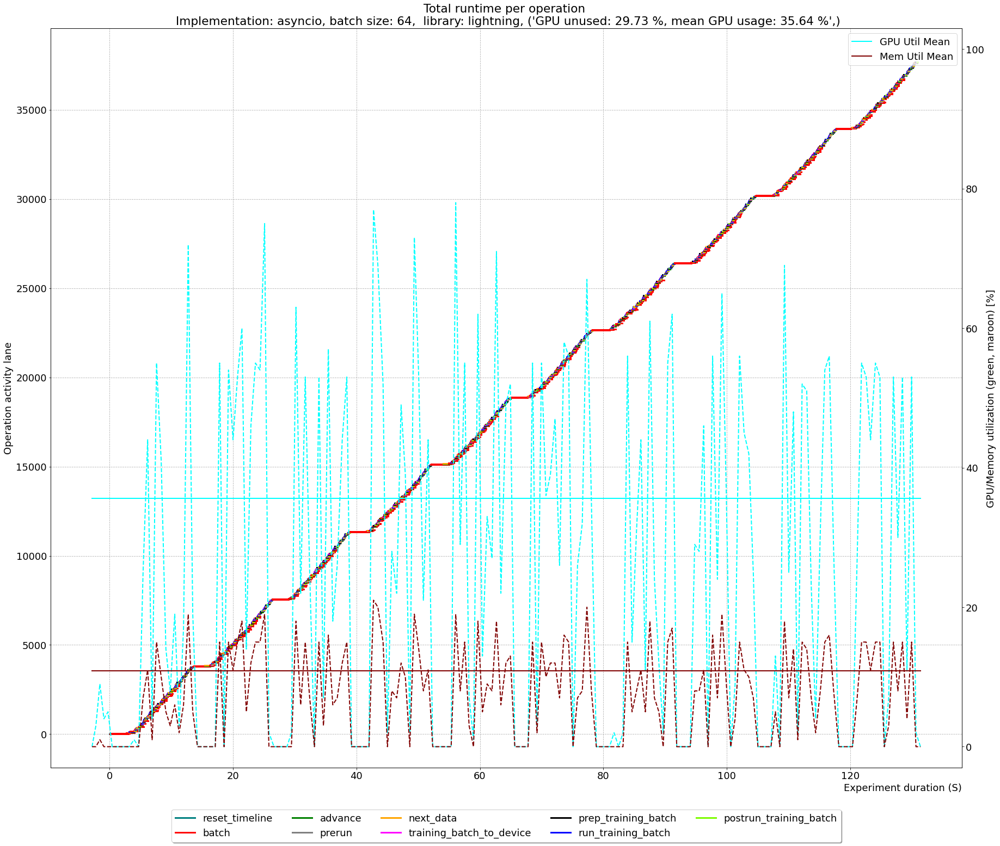

timestamp False
34.233333333333334 22.74390243902439


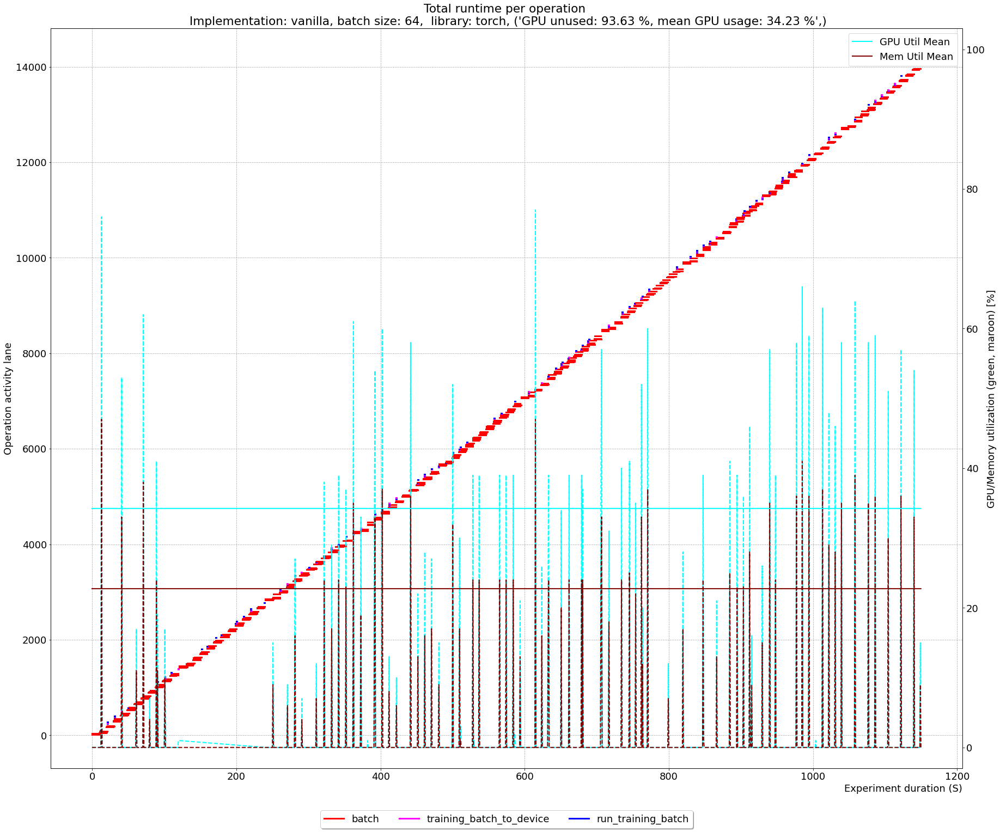

timestamp False
26.08542713567839 8.96875


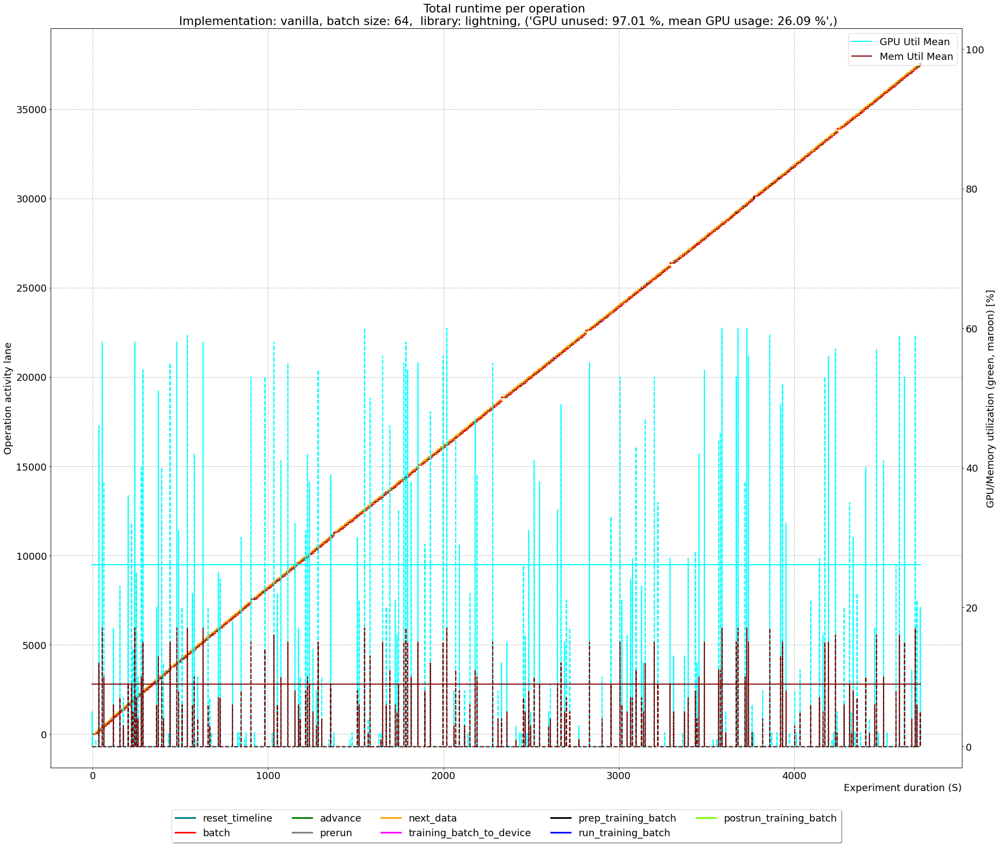

timestamp False
36.91463414634146 21.9375


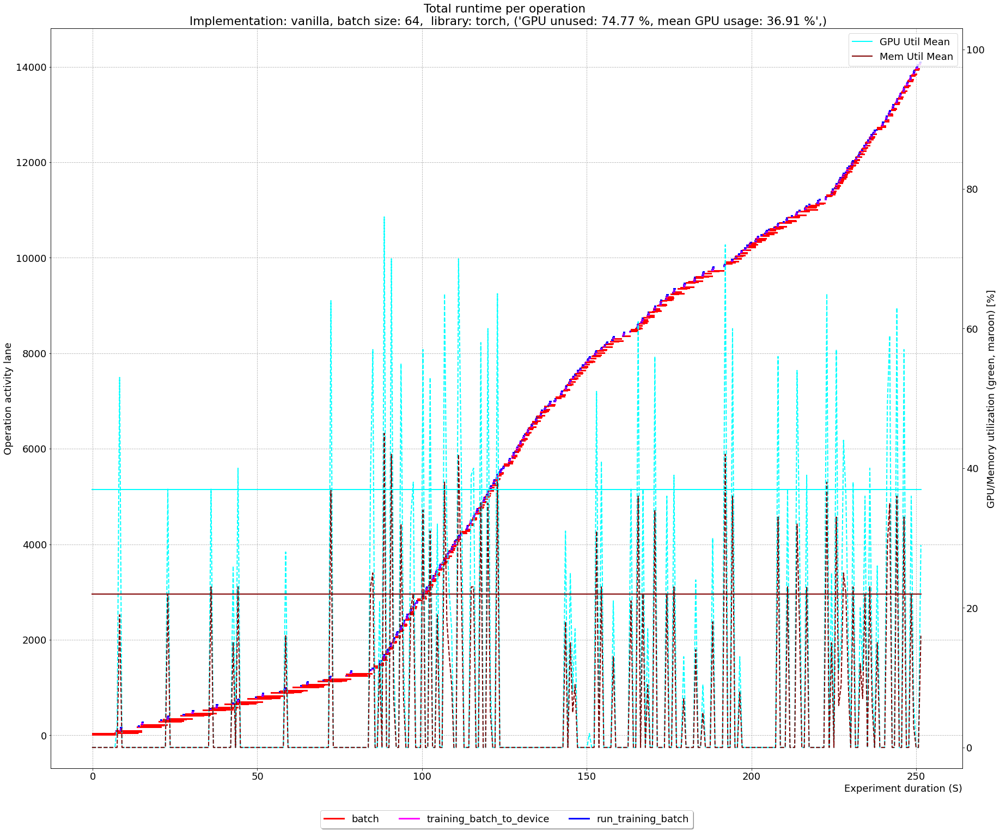

timestamp False
30.46315789473684 10.032051282051283


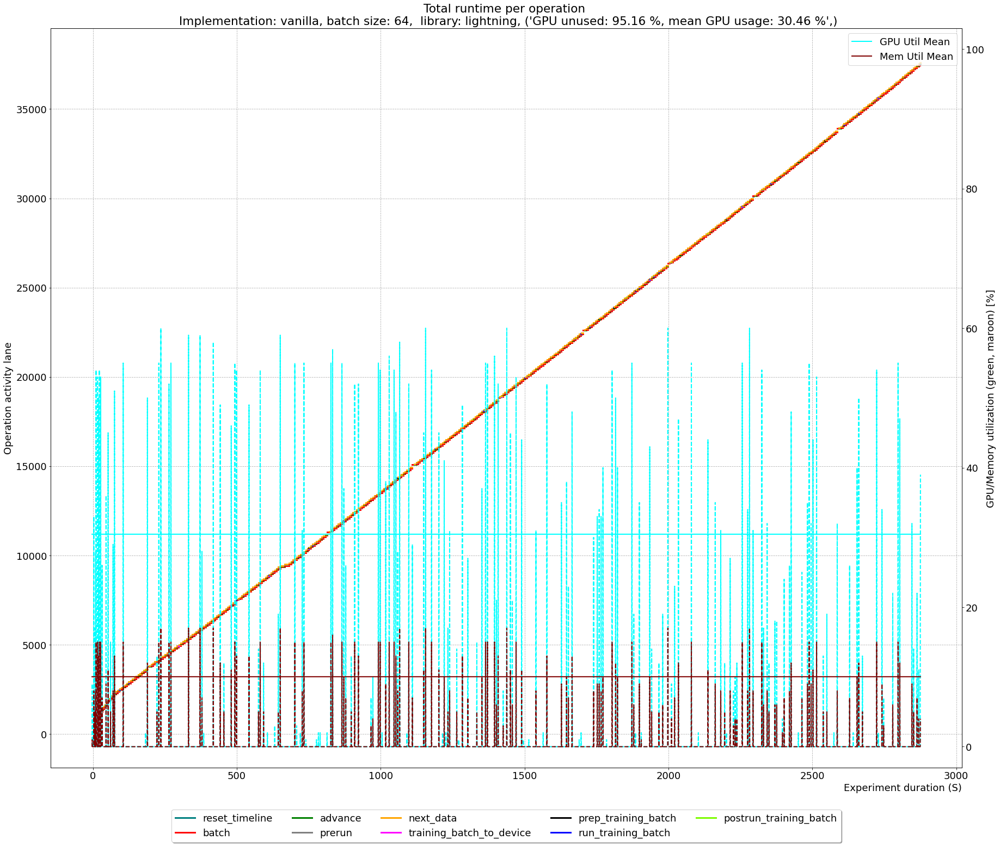

In [8]:
unique_runs_s3, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_s3)
returns_s3 = []

for run in sorted(unique_runs_s3):
    df = df_dataloader_s3[df_dataloader_s3["run"]==run]
    dfgpu = df_gpuutil_s3[df_gpuutil_s3["run"]==run]
    df = df.drop_duplicates(subset="id", keep="first", inplace=False) 
    result = show_timelines_with_gpu(df, dfgpu, lanes, colors, run, False, True, False, 2)
    result["run"]=run
    returns_s3.append(result)

timestamp False
55.319148936170215 32.93478260869565


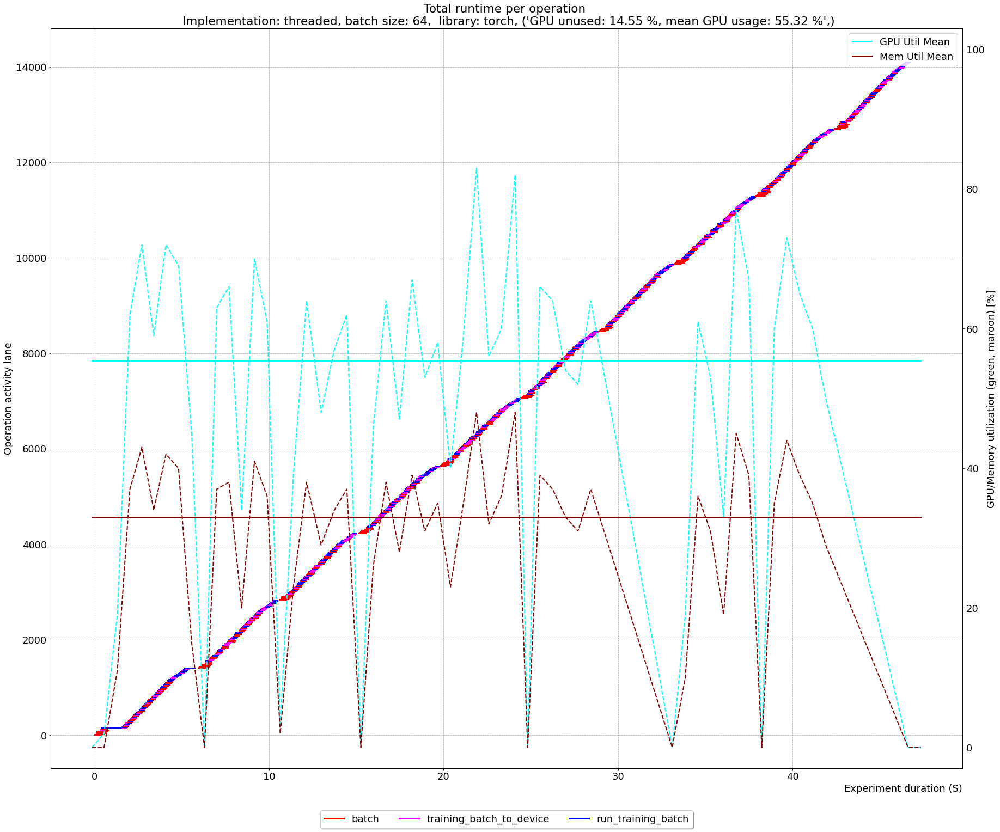

timestamp False
36.30434782608695 11.308641975308642


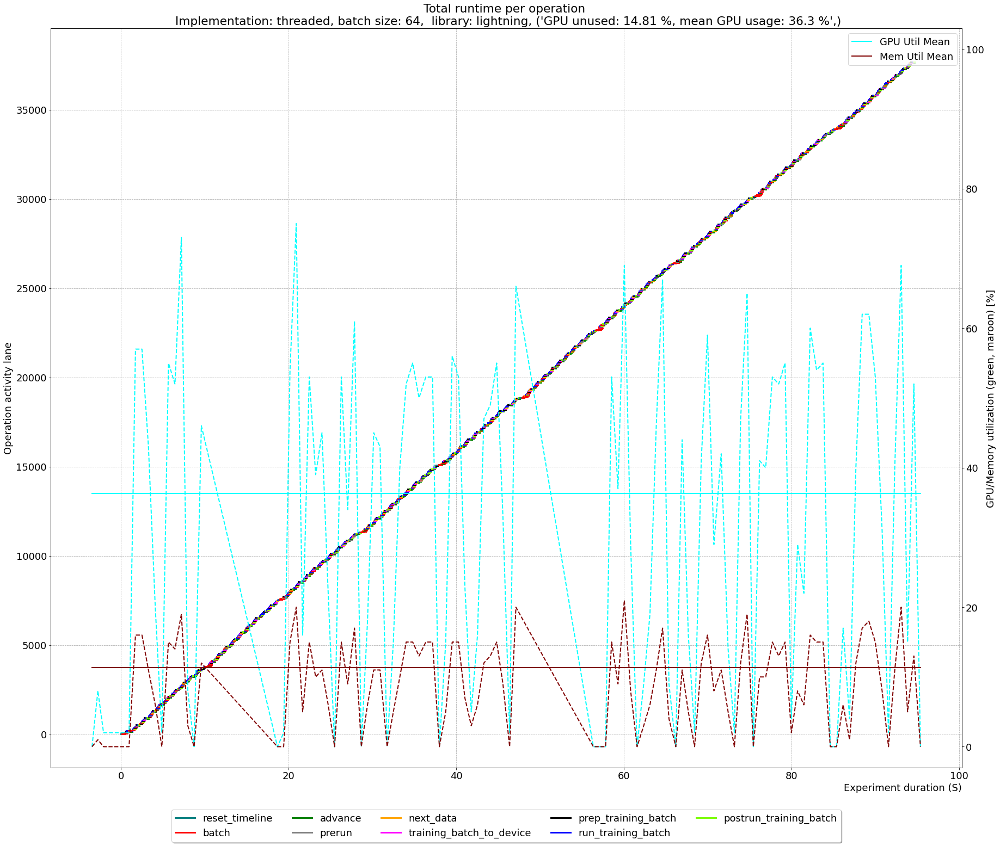

timestamp False
61.266666666666666 36.898305084745765


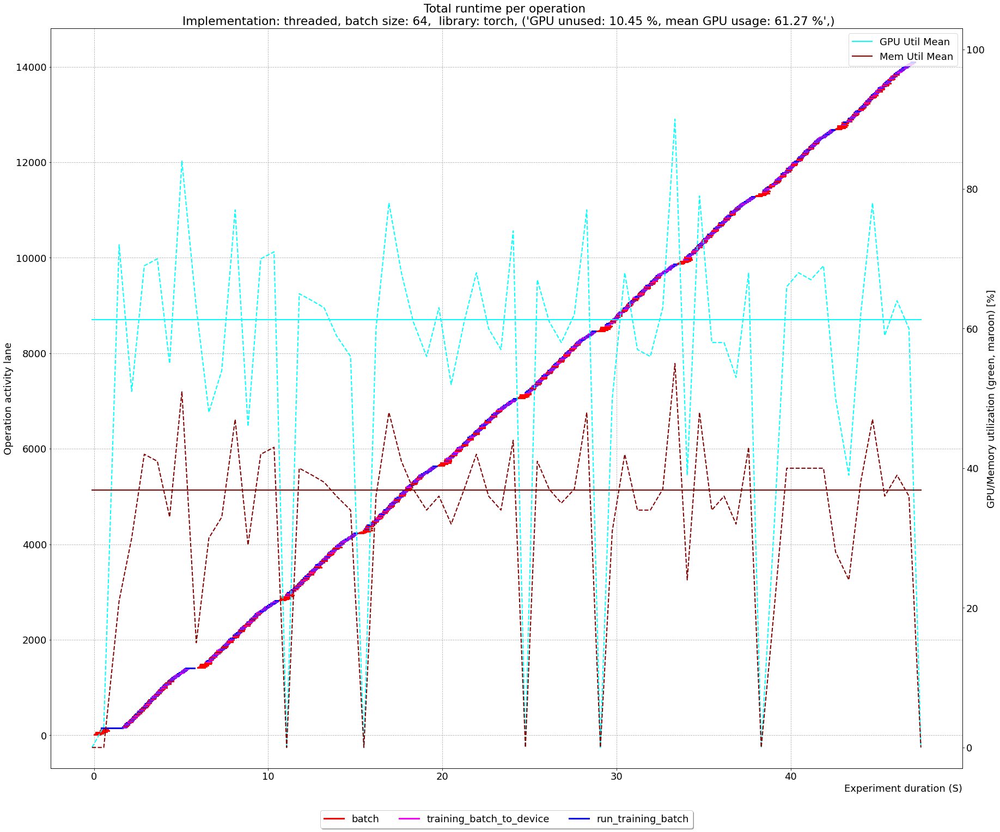

timestamp False
43.325 12.785714285714286


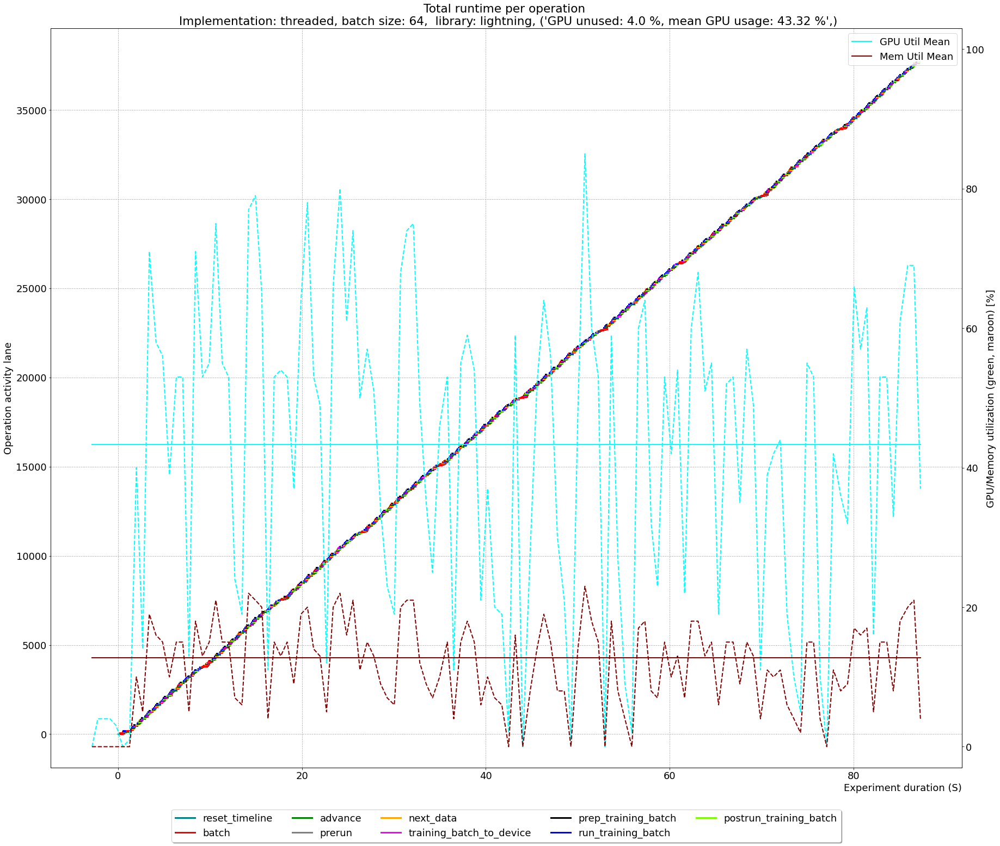

timestamp False
59.03389830508475 35.35087719298246


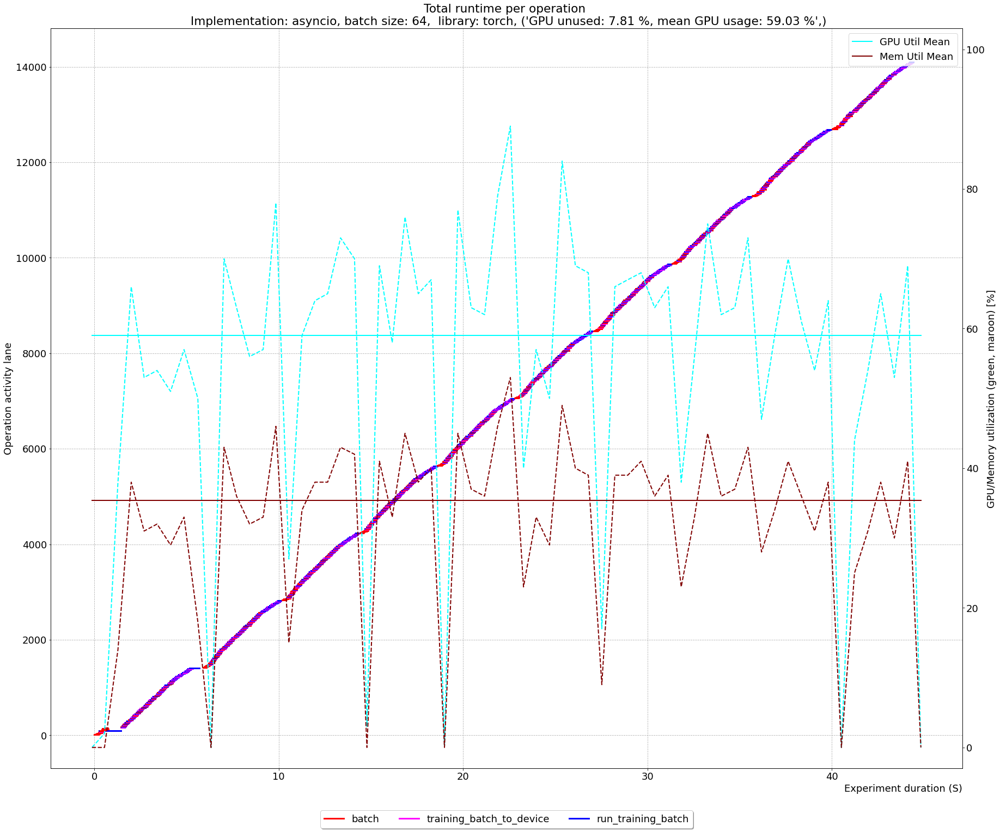

timestamp False
42.13793103448276 12.416666666666666


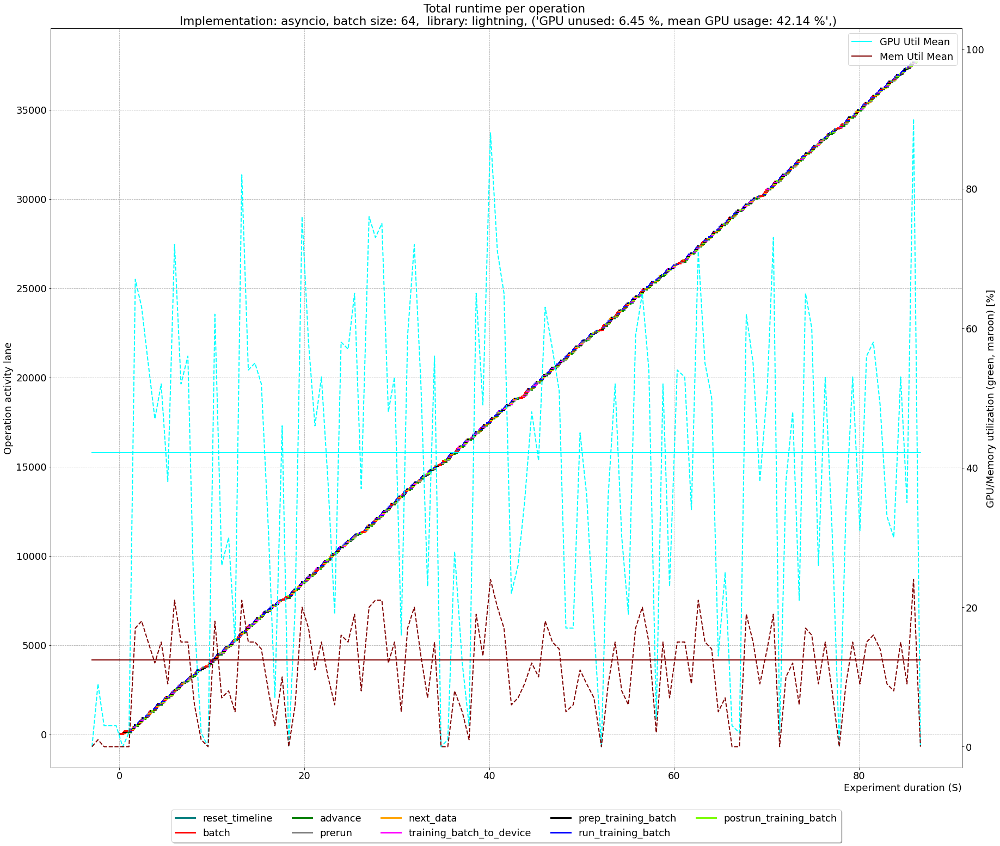

timestamp False
62.283018867924525 38.11538461538461


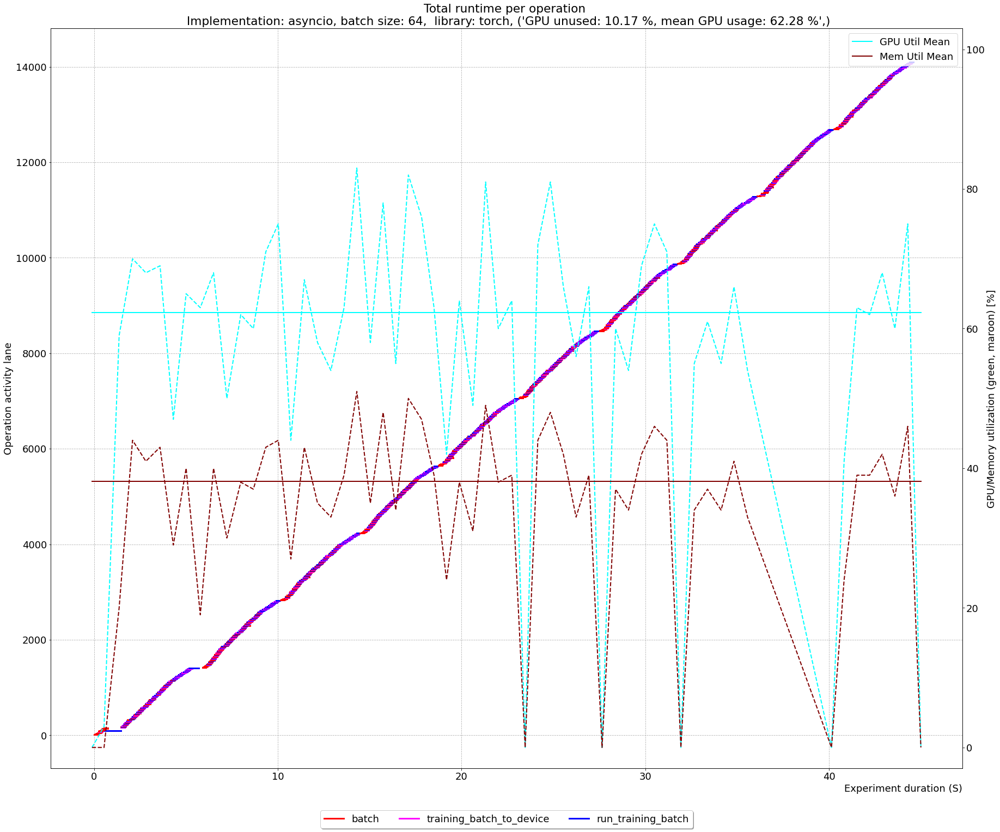

timestamp False
42.293103448275865 12.616822429906541


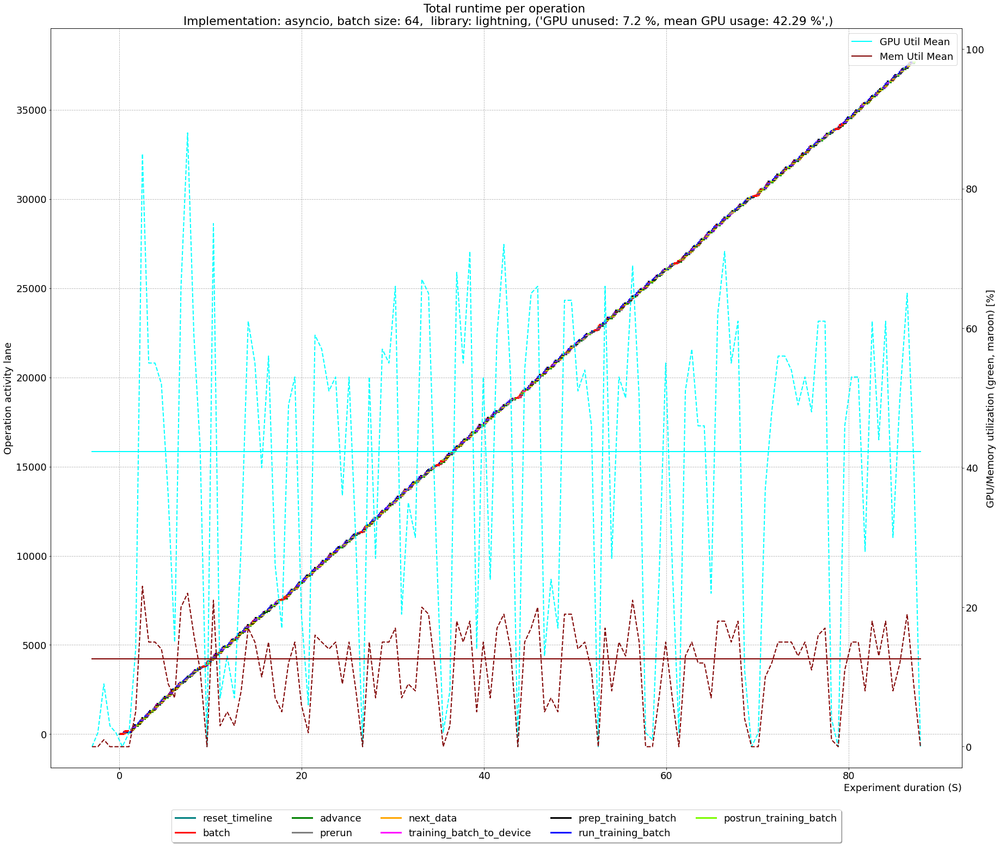

timestamp False
46.473684210526315 26.649122807017545


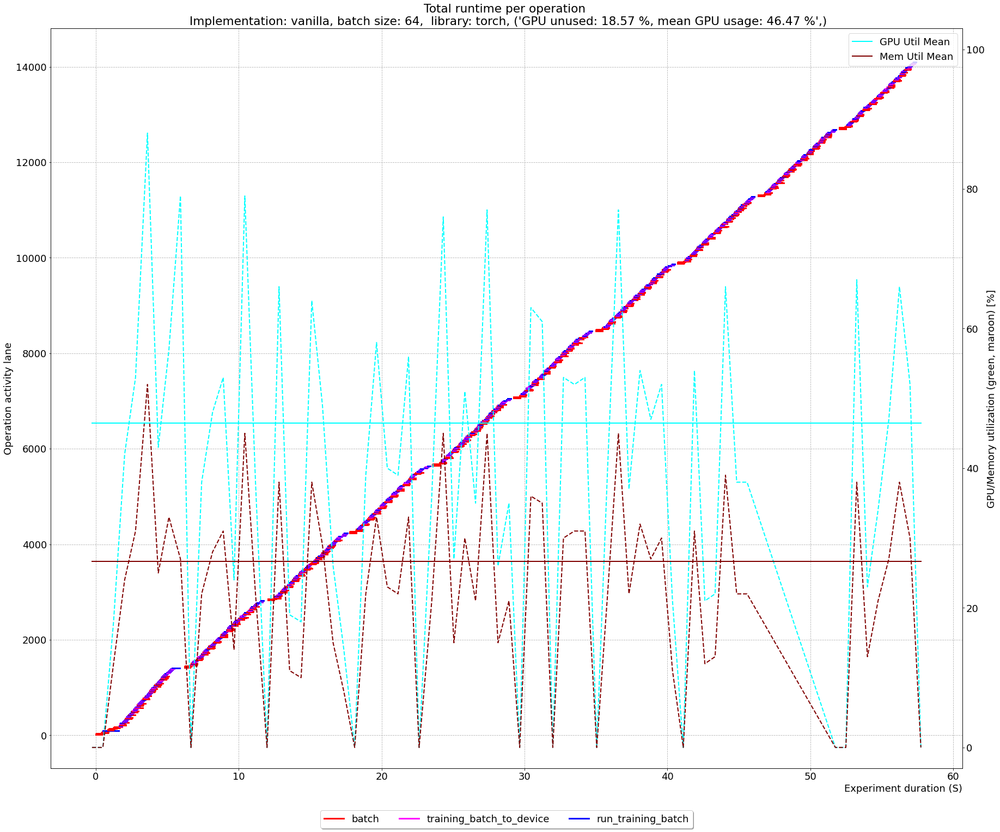

timestamp False
29.122340425531913 9.259036144578314


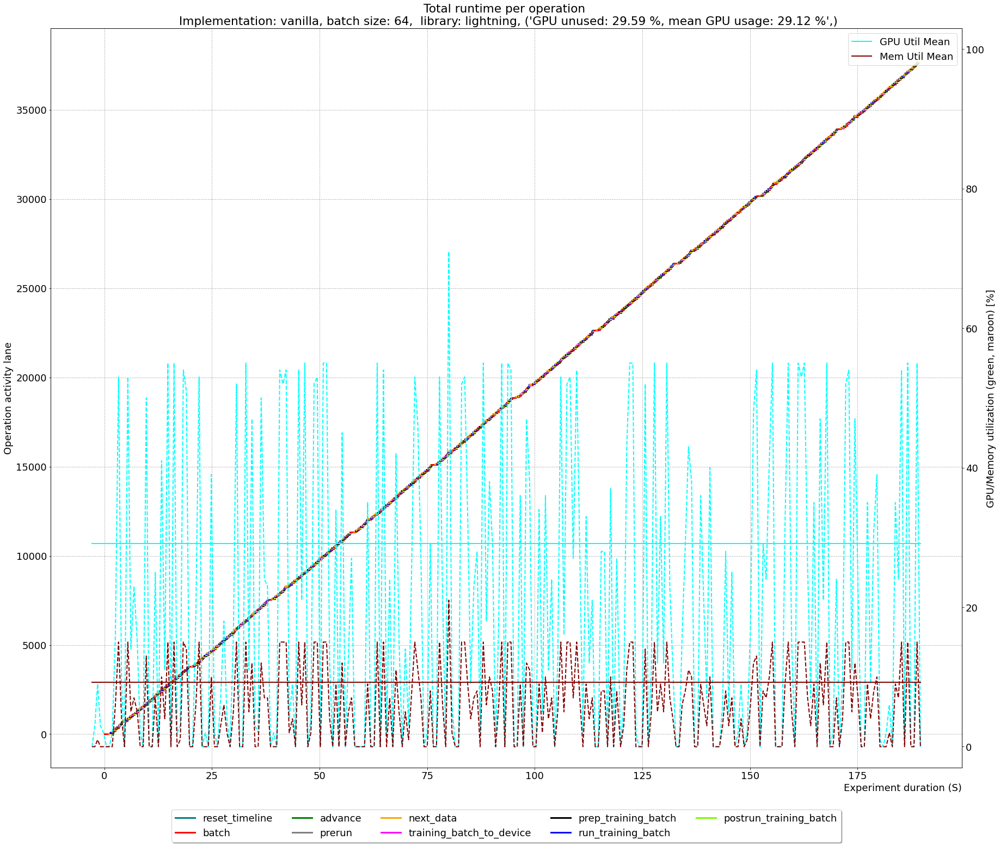

timestamp False
47.08955223880597 27.46268656716418


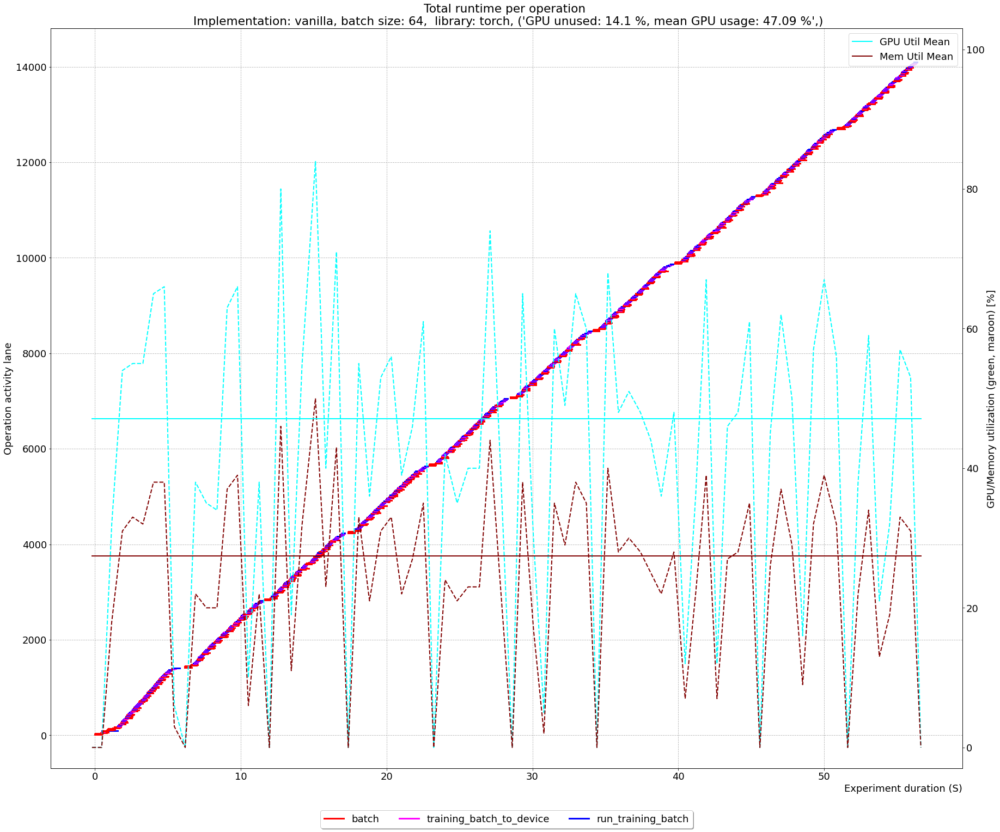

timestamp False
29.56149732620321 10.019736842105264


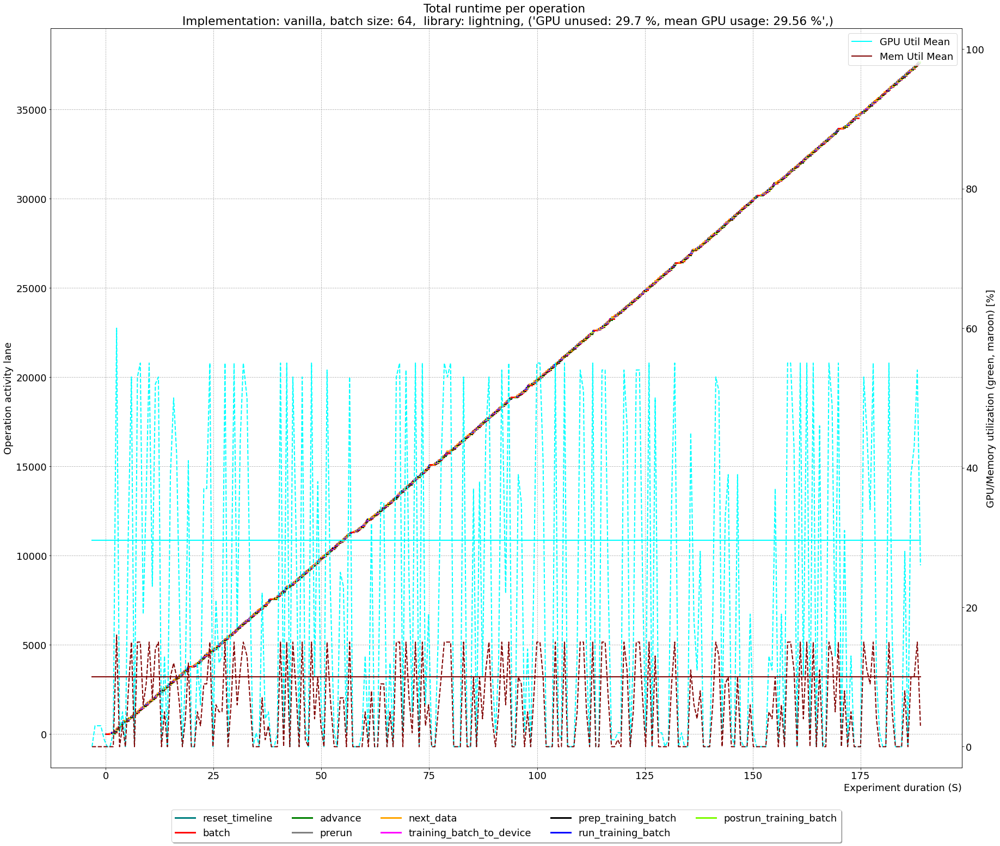

In [9]:
unique_runs_scratch, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_scratch)
returns_scratch = []

for run in sorted(unique_runs_scratch):
    df = df_dataloader_scratch[df_dataloader_scratch["run"]==run]
    dfgpu = df_gpuutil_scratch[df_gpuutil_scratch["run"]==run]
    df = df.drop_duplicates(subset="id", keep="first", inplace=False)
    result = show_timelines_with_gpu(df, dfgpu, lanes, colors, run, False, True, False, 2)
    result["run"]=run
    returns_scratch.append(result)

### Result tables

The following two tables display throughput details for both experiments. The default sample size, i.e. number of dataset items is 15000.

In [13]:
# sanity check
get_metadata_info(output_base_folder / "1711-cache/s3" / unique_runs_s3[0])

Dataset:  3000
Batch size: 64
Epochs:  10
Images total:  30000
Batches per epoch 47
Images total (rounded):  30080


(3000, 64, 10, 30000, 47, 30080)

#### AWS S3

In [14]:
df_full_s3 = extract_pandas(output_base_folder, folder_filter=s3_folder_filter)
results_s3 = pd.DataFrame.from_records(data=returns_s3)
r_s3 = get_throughput(results_s3, "1711-cache/s3", df_full_s3, unique_runs_s3, output_base_folder)
r_s3.round(2)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 432/432 [00:10<00:00, 42.30it/s]


,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,fig,throughput,dl_MB,imgs,Mbit/s,MB/s
0,138.41,54.24,40.01,10.56,25.27,threaded,0,torch,Figure(2160x1800),216.75,2848.22,30000,164.63,20.58
1,135.65,30.11,37.64,7.28,11.38,threaded,0,lightning,Figure(2160x1800),221.15,2846.71,30000,167.88,20.99
2,107.75,44.44,36.64,11.84,22.83,threaded,1,torch,Figure(2160x1800),278.42,2856.13,30000,212.05,26.51
3,126.96,28.49,39.51,7.82,12.07,threaded,1,lightning,Figure(2160x1800),236.30,2772.35,30000,174.69,21.84
4,154.68,59.77,35.73,8.74,23.75,asyncio,0,torch,Figure(2160x1800),193.95,3110.65,30000,160.88,20.11
5,155.95,39.47,38.88,6.43,11.77,asyncio,0,lightning,Figure(2160x1800),192.37,3110.65,30000,159.57,19.95
6,120.10,57.35,35.81,9.27,23.35,asyncio,1,torch,Figure(2160x1800),249.79,3110.65,30000,207.20,25.90
7,130.87,29.73,35.64,6.90,10.91,asyncio,1,lightning,Figure(2160x1800),229.23,3110.65,30000,190.15,23.77
8,1149.12,93.63,34.23,1.32,22.74,vanilla,0,torch,Figure(2160x1800),26.11,3110.65,30000,21.66,2.71
9,4718.63,97.01,26.09,0.22,8.97,vanilla,0,lightning,Figure(2160x1800),6.36,3110.65,30000,5.27,0.66


#### Scratch

In [15]:
df_full_scratch = extract_pandas(output_base_folder, folder_filter=scratch_folder_filter)
results_scratch = pd.DataFrame.from_records(data=returns_scratch)
r_scratch = get_throughput(results_scratch, "1711-cache/scratch", df_full_scratch, unique_runs_scratch, output_base_folder)
r_scratch.round(2)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 432/432 [00:10<00:00, 41.48it/s]


,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,fig,throughput,dl_MB,imgs,Mbit/s,MB/s
0,46.51,14.55,55.32,27.55,32.93,threaded,0,torch,Figure(2160x1800),644.97,5050.06,30000,868.57,108.57
1,94.67,14.81,36.30,8.48,11.31,threaded,0,lightning,Figure(2160x1800),316.90,5064.10,30000,427.95,53.49
2,46.96,10.45,61.27,32.49,36.90,threaded,1,torch,Figure(2160x1800),638.85,5071.20,30000,863.93,107.99
3,87.13,4.00,43.32,11.46,12.79,threaded,1,lightning,Figure(2160x1800),344.33,5074.75,30000,465.97,58.25
4,44.25,7.81,59.03,31.48,35.35,asyncio,0,torch,Figure(2160x1800),678.01,2857.10,30000,516.57,64.57
5,86.19,6.45,42.14,10.81,12.42,asyncio,0,lightning,Figure(2160x1800),348.06,2857.10,30000,265.18,33.15
6,44.41,10.17,62.28,33.59,38.12,asyncio,1,torch,Figure(2160x1800),675.55,2857.10,30000,514.70,64.34
7,87.17,7.20,42.29,10.80,12.62,asyncio,1,lightning,Figure(2160x1800),344.15,2857.10,30000,262.21,32.78
8,57.24,18.57,46.47,21.70,26.65,vanilla,0,torch,Figure(2160x1800),524.08,2857.10,30000,399.30,49.91
9,189.17,29.59,29.12,5.76,9.26,vanilla,0,lightning,Figure(2160x1800),158.59,2857.10,30000,120.83,15.10


### Bar plots

In [101]:
font_size=30
params = {'legend.fontsize': font_size,
          'figure.figsize': (20, 15),
          'axes.labelsize': font_size,
          'axes.titlesize': font_size,
          'xtick.labelsize': font_size,
          'ytick.labelsize': font_size}

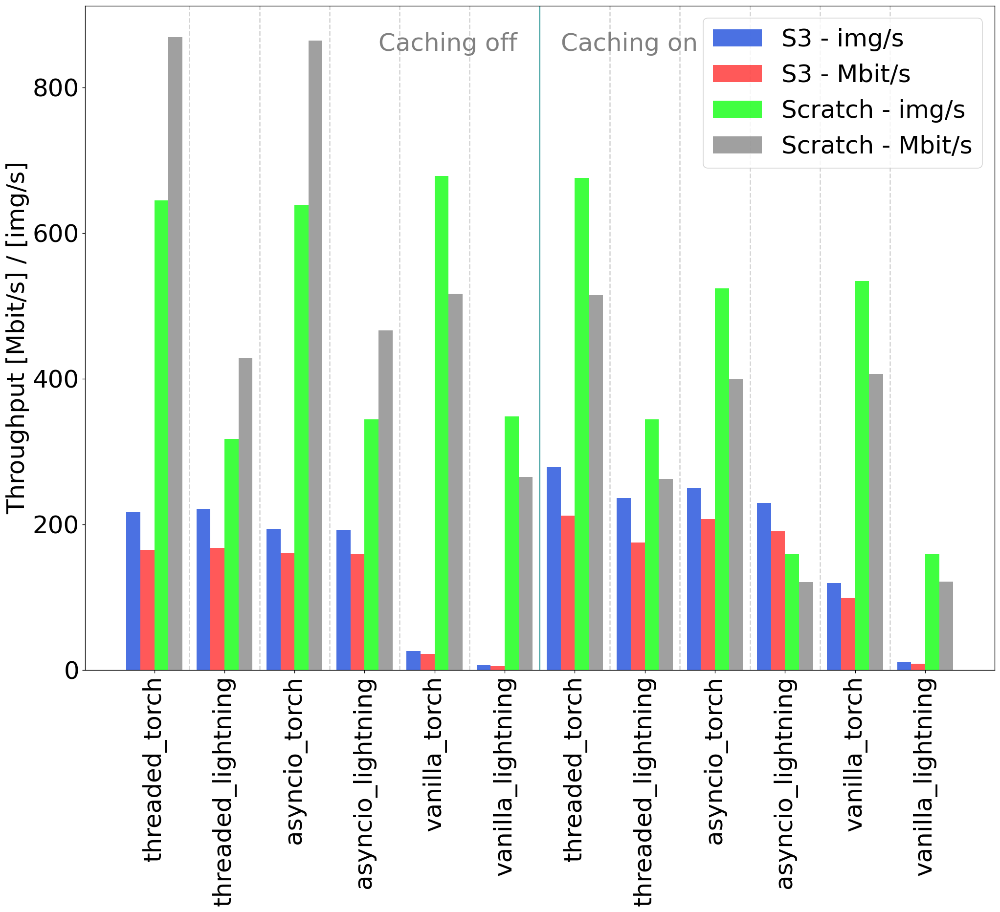

In [168]:
# S3

plt.rcParams.update(params)
fig, ax = plt.subplots(dpi=120)

offset = 0
width = 0.2
x_labels = []
cached_offset = 6
nocache_offset = 0

for i in range(12):
    if int(r_s3.iloc[i][6]) == 0:
        offset = nocache_offset
        nocache_offset += 1
    else:
        offset = cached_offset
        cached_offset += 1
    tp_img = r_s3.iloc[i][9]
    tp_mbit= r_s3.iloc[i][12]

    label = f"{r_s3.iloc[i][5]}_{r_s3.iloc[i][7]}"
    x_labels.append((offset, label))

    ax.bar(height=tp_img, x=offset-0.3, width=width, 
           align='center', alpha=0.95, ecolor='black', capsize=5,
           label=label, color="royalblue")
    ax.bar(height=tp_mbit, x=offset-0.1, width=width, 
           align='center', alpha=0.65, ecolor='black', capsize=5,
           label=label, color="red")
    
    tp_img = r_scratch.iloc[i][9]
    tp_mbit= r_scratch.iloc[i][12]
    label = f"{r_scratch.iloc[i][5]}_{r_scratch.iloc[i][7]}_{r_scratch.iloc[i][6]}"

    ax.bar(height=tp_img, x=i+0.1, width=width, align='center', alpha=0.75, ecolor='black', capsize=5,
           label=label, color="lime")
    ax.bar(height=tp_mbit, x=i+0.3, width=width, align='center', alpha=0.75, ecolor='black', capsize=5,
           label=label, color="gray") 


x_labels = [label[1] for label in sorted(x_labels)]
ax.set_xticks(np.arange(len(x_labels)), x_labels, rotation="90")
ax.legend(["S3 - img/s", "S3 - Mbit/s", "Scratch - img/s", "Scratch - Mbit/s"])
ax.set_ylabel("Throughput [Mbit/s] / [img/s]")
ax.text(3.2, 850, "Caching off", fontsize=font_size, color="gray")
ax.text(5.8, 850, "Caching on", fontsize=font_size, color="gray")
    
for i in range(11):
    if i == 5: 
        plt.axvline(x=i+0.5, color="teal", linestyle="-", linewidth=1)
    else:
        plt.axvline(x=i+0.5, color="lightgray", linestyle="--", linewidth=1.5) 

In [169]:
fig.savefig(f"caching-throughput-1.pdf", bbox_inches='tight')

### Highlight differences

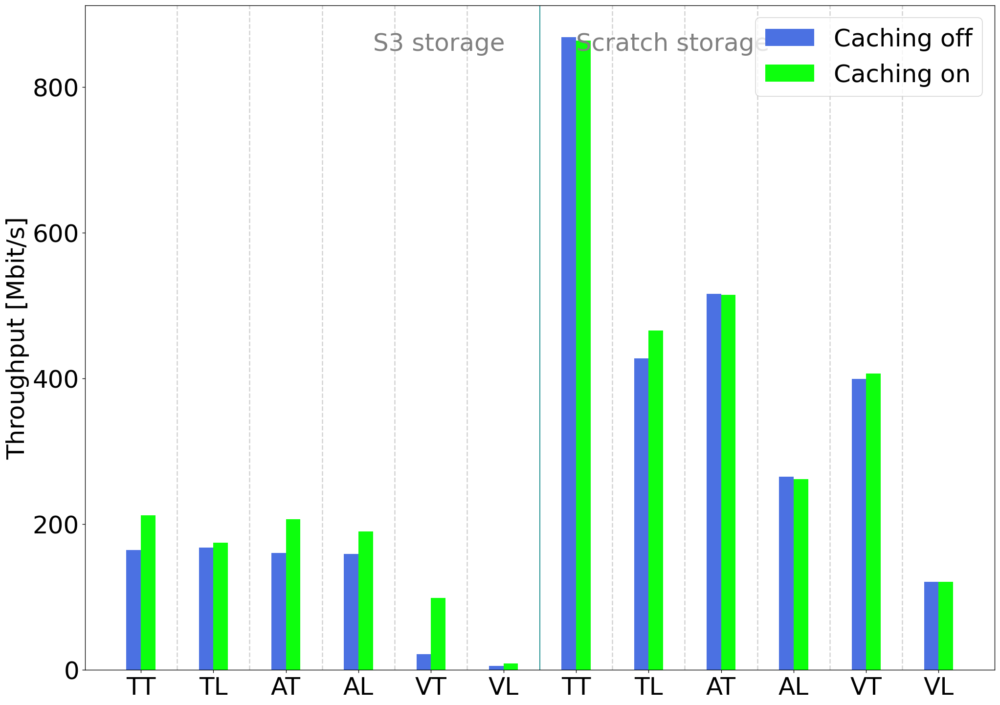

In [170]:
# S3

plt.rcParams.update(params)
fig, ax = plt.subplots(dpi=120)

offset = 0
width = 0.2
x_labels = []
cached_offset = 6
nocache_offset = 0

for i in range(12):
    if int(r_s3.iloc[i][6]) == 0:
        offset = nocache_offset
        nocache_offset += 1
    else:
        offset = cached_offset
        cached_offset += 1
    label = f"{r_s3.iloc[i][5][0]}{r_s3.iloc[i][7][0]}".upper()
    x_labels.append((offset, label, r_s3.iloc[i][12], r_scratch.iloc[i][12]))

s3_throughputs = [label[2] for label in sorted(x_labels)]
scratch_throughputs = [label[3] for label in sorted(x_labels)]
    
for i in range(6):
    ax.bar(height=s3_throughputs[i], x=i-0.1, width=width, 
           align='center', alpha=0.95, ecolor='black', capsize=5,
           label=label, color="royalblue")
    ax.bar(height=s3_throughputs[6+i], x=i+0.1, width=width, 
           align='center', alpha=0.95, ecolor='black', capsize=5,
           label=label, color="lime")
    
    ax.bar(height=scratch_throughputs[i], x=6+i-0.1, width=width, 
           align='center', alpha=0.95, ecolor='black', capsize=5,
           label=label, color="royalblue")
    ax.bar(height=scratch_throughputs[6+i], x=6+i+0.1, width=width, 
           align='center', alpha=0.95, ecolor='black', capsize=5,
           label=label, color="lime")

x_labels = [label[1] for label in sorted(x_labels)]
ax.set_xticks(np.arange(len(x_labels)), x_labels, rotation="0")
ax.legend(["Caching off", "Caching on"])
ax.set_ylabel("Throughput [Mbit/s]")

ax.text(3.2, 850, "S3 storage", fontsize=font_size, color="gray")
ax.text(6.0, 850, "Scratch storage", fontsize=font_size, color="gray")

for i in range(11):
    if i == 5: 
        plt.axvline(x=i+0.5, color="teal", linestyle="-", linewidth=1)
    else:
        plt.axvline(x=i+0.5, color="lightgray", linestyle="--", linewidth=1.5) 
    
# ax.set_ylim([-10, 85])


In [171]:
fig.savefig(f"caching-throughput-2.pdf", bbox_inches='tight')